# Quantum GANs: The Patch Method

## Module Imports

In [1]:
# Library imports
import math
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pennylane as qml

# Pytorch imports
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader

# Set the random seed for reproducibility
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)

## Data

In [2]:
color_channel = 1
image_size = 256 

In [3]:
class DigitsDataset(Dataset):
    def __init__(self, digit_path, label_path, transform=None):
        
        image = (255 - np.load(digit_path)) / 255
        label = np.load(label_path)

        self.image = torch.tensor(image[label==0]).float().unsqueeze(1)
        self.length = len(self.image)

        self.transform = transform


    def __len__(self):
        return self.length

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        
        image = self.image[idx, :, :]

        if self.transform:
            image = self.transform(image)
        
        return image, 0

In [4]:
batch_size = 1

dataset = DigitsDataset('data/digit_256.npy', 'data/label_256.npy')

dataloader = torch.utils.data.DataLoader(
    dataset, batch_size=batch_size, shuffle=True, drop_last=True
)

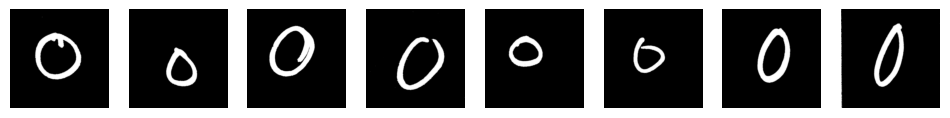

In [5]:
plt.figure(figsize=(12,10))

for i, idx in enumerate(random.sample(range(len(dataset)), 8)):
    image = dataset[idx][0].permute(1, 2, 0)
    plt.subplot(1,8,i+1)
    plt.axis('off')
    plt.imshow(image.numpy(), 'gray')

plt.show()

## Implementing the Discriminator

In [6]:
class Discriminator(nn.Module):
    """Fully connected classical discriminator"""

    def __init__(self):
        super().__init__()

        nc = color_channel
        ndf = 1

        self.conv1 = nn.Conv2d(
            in_channels=nc,
            out_channels=2, 
            kernel_size=4,
            stride=4,
            padding=0,
            bias=False
        )
        self.relu1 = nn.LeakyReLU(0.2, inplace=True)

        self.conv2 = nn.Conv2d(
            in_channels=2,
            out_channels=4, 
            kernel_size=4,
            stride=4,
            padding=0,
            bias=False
        )
        self.relu2 = nn.LeakyReLU(0.2, inplace=True)

        self.conv3 = nn.Conv2d(
            in_channels=4,
            out_channels=8, 
            kernel_size=4,
            stride=4,
            padding=0,
            bias=False
        )
        self.relu3 = nn.LeakyReLU(0.2, inplace=True)

        self.conv4 = nn.Conv2d(
            in_channels=8,
            out_channels=1, 
            kernel_size=4,
            stride=4,
            padding=0,
            bias=False
        )

        self.sigmoid = nn.Sigmoid()


    def forward(self, x):
        x = self.conv1(x)
        x = self.relu1(x)

        x = self.conv2(x)
        x = self.relu2(x)

        x = self.conv3(x)
        x = self.relu3(x)

        x = self.conv4(x)
        x = self.sigmoid(x)
        return x

## Implementing the Generator

In [7]:
# Quantum simulator
dev = qml.device("lightning.gpu", wires=10, batch_obs=True)
# dev_9bit = qml.device("default.qubit", wires=9)

# Enable CUDA device if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# device = torch.device('cpu')

In [8]:
@qml.qnode(dev, interface="torch", diff_method="parameter-shift")
def quantum_circuit(inputs, weight):
    q_depth, n_qubits = weight.shape

    # Initialise latent vectors
    for i in range(n_qubits):
        qml.RY(inputs[i], wires=i)

    # Repeated layer
    for i in range(q_depth):
        # Parameterised layer
        for y in range(n_qubits):
            qml.RY(weight[i][y], wires=y)

        # Control Z gates
        for y in range(n_qubits - 1):
            qml.CZ(wires=[y, y + 1])

    return qml.probs(wires=list(range(n_qubits)))

In [9]:
class QuantumLinear(nn.Module):
    def __init__(self, in_size, n_ancilla=0, q_depth=5, q_delta=1):
        super().__init__()
        
        self.patch_size = 2 ** ((in_size - n_ancilla) // 2)
        self.partial_size = 2 ** ((in_size - n_ancilla))

        weight_shape = {'weight': (q_depth, in_size)}
        self.qlayer = qml.qnn.TorchLayer(quantum_circuit, weight_shape)
    
    def forward(self, x):        
        batch = torch.cat([
            self.qlayer(elem.contiguous().view(-1))[:self.partial_size]
                .view(1, 1, self.patch_size, self.patch_size)
            for elem in x
        ]).to(device)
        return batch / batch.max()

In [10]:
class PatchQuantumGenerator(nn.Module):
    """Quantum generator class for the patch method"""

    def __init__(self, in_size, out_size, n_ancilla=0, q_depth=5):
        super().__init__()

        self.in_size = in_size
        self.out_size = out_size
        self.patch_size = 2 ** ((in_size - n_ancilla) // 2)
        self.n_subgen = (out_size // self.patch_size) ** 2
        
        self.layers = nn.ModuleList([
            QuantumLinear(in_size, n_ancilla, q_depth)
            for _ in range(self.n_subgen)
        ])

    def forward(self, x):
        batch = torch.cat([
            self.layers[i](x)
            for i in range(self.n_subgen)
        ], dim=-1).view(-1, 1, self.out_size, self.out_size)
        return batch

## Training

In [11]:
lrG = 0.01  # Learning rate for the generator
lrD = 0.001  # Learning rate for the discriminator
num_iter = 500   # Number of training iterations

latent_size = 10

Iteration: 1, Discriminator Loss: 1.399, Generator Loss: 0.692
Iteration: 2, Discriminator Loss: 1.391, Generator Loss: 0.693
Iteration: 3, Discriminator Loss: 1.382, Generator Loss: 0.694
Iteration: 4, Discriminator Loss: 1.386, Generator Loss: 0.694
Iteration: 5, Discriminator Loss: 1.387, Generator Loss: 0.697
Iteration: 6, Discriminator Loss: 1.393, Generator Loss: 0.693
Iteration: 7, Discriminator Loss: 1.384, Generator Loss: 0.693
Iteration: 8, Discriminator Loss: 1.386, Generator Loss: 0.694
Iteration: 9, Discriminator Loss: 1.391, Generator Loss: 0.693
Iteration: 10, Discriminator Loss: 1.378, Generator Loss: 0.692


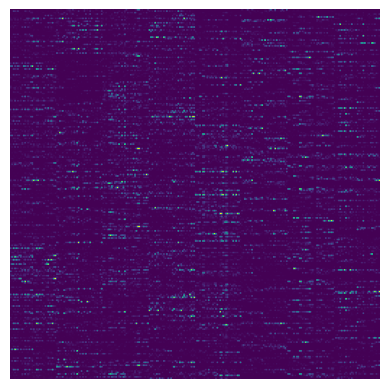

Iteration: 11, Discriminator Loss: 1.378, Generator Loss: 0.694
Iteration: 12, Discriminator Loss: 1.385, Generator Loss: 0.695
Iteration: 13, Discriminator Loss: 1.387, Generator Loss: 0.695
Iteration: 14, Discriminator Loss: 1.384, Generator Loss: 0.695
Iteration: 15, Discriminator Loss: 1.390, Generator Loss: 0.693
Iteration: 16, Discriminator Loss: 1.384, Generator Loss: 0.696
Iteration: 17, Discriminator Loss: 1.384, Generator Loss: 0.694
Iteration: 18, Discriminator Loss: 1.378, Generator Loss: 0.694
Iteration: 19, Discriminator Loss: 1.375, Generator Loss: 0.696
Iteration: 20, Discriminator Loss: 1.379, Generator Loss: 0.695


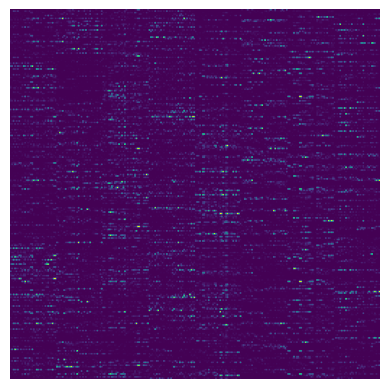

Iteration: 21, Discriminator Loss: 1.386, Generator Loss: 0.691
Iteration: 22, Discriminator Loss: 1.365, Generator Loss: 0.696
Iteration: 23, Discriminator Loss: 1.382, Generator Loss: 0.693
Iteration: 24, Discriminator Loss: 1.391, Generator Loss: 0.692
Iteration: 25, Discriminator Loss: 1.381, Generator Loss: 0.695
Iteration: 26, Discriminator Loss: 1.379, Generator Loss: 0.691
Iteration: 27, Discriminator Loss: 1.388, Generator Loss: 0.695
Iteration: 28, Discriminator Loss: 1.371, Generator Loss: 0.696
Iteration: 29, Discriminator Loss: 1.368, Generator Loss: 0.696
Iteration: 30, Discriminator Loss: 1.378, Generator Loss: 0.695


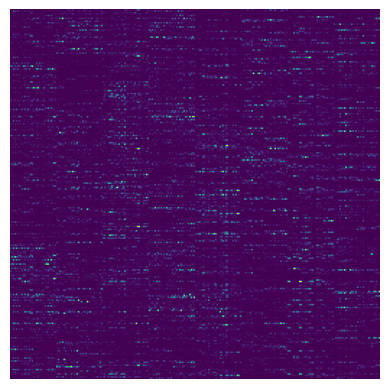

Iteration: 31, Discriminator Loss: 1.381, Generator Loss: 0.692
Iteration: 32, Discriminator Loss: 1.357, Generator Loss: 0.694
Iteration: 33, Discriminator Loss: 1.364, Generator Loss: 0.689
Iteration: 34, Discriminator Loss: 1.356, Generator Loss: 0.694
Iteration: 35, Discriminator Loss: 1.358, Generator Loss: 0.690
Iteration: 36, Discriminator Loss: 1.371, Generator Loss: 0.697
Iteration: 37, Discriminator Loss: 1.353, Generator Loss: 0.687
Iteration: 38, Discriminator Loss: 1.379, Generator Loss: 0.690
Iteration: 39, Discriminator Loss: 1.302, Generator Loss: 0.693
Iteration: 40, Discriminator Loss: 1.325, Generator Loss: 0.692


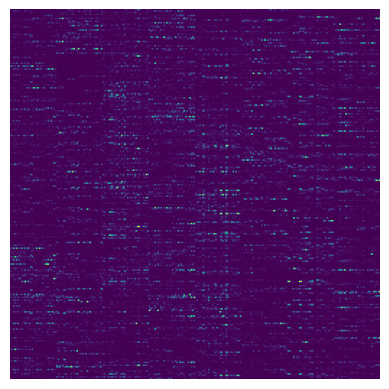

Iteration: 41, Discriminator Loss: 1.311, Generator Loss: 0.694
Iteration: 42, Discriminator Loss: 1.350, Generator Loss: 0.686
Iteration: 43, Discriminator Loss: 1.297, Generator Loss: 0.679
Iteration: 44, Discriminator Loss: 1.348, Generator Loss: 0.685
Iteration: 45, Discriminator Loss: 1.325, Generator Loss: 0.691
Iteration: 46, Discriminator Loss: 1.299, Generator Loss: 0.688
Iteration: 47, Discriminator Loss: 1.317, Generator Loss: 0.679
Iteration: 48, Discriminator Loss: 1.305, Generator Loss: 0.679
Iteration: 49, Discriminator Loss: 1.330, Generator Loss: 0.679
Iteration: 50, Discriminator Loss: 1.268, Generator Loss: 0.674


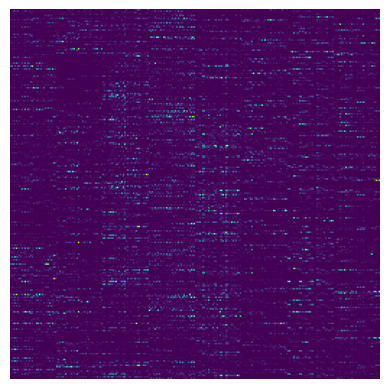

Iteration: 51, Discriminator Loss: 1.403, Generator Loss: 0.674
Iteration: 52, Discriminator Loss: 1.295, Generator Loss: 0.671
Iteration: 53, Discriminator Loss: 1.277, Generator Loss: 0.675
Iteration: 54, Discriminator Loss: 1.252, Generator Loss: 0.685
Iteration: 55, Discriminator Loss: 1.147, Generator Loss: 0.667
Iteration: 56, Discriminator Loss: 1.230, Generator Loss: 0.675
Iteration: 57, Discriminator Loss: 1.248, Generator Loss: 0.684
Iteration: 58, Discriminator Loss: 1.235, Generator Loss: 0.654
Iteration: 59, Discriminator Loss: 1.125, Generator Loss: 0.671
Iteration: 60, Discriminator Loss: 1.001, Generator Loss: 0.656


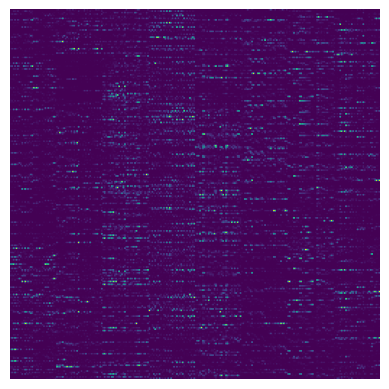

Iteration: 61, Discriminator Loss: 1.134, Generator Loss: 0.656
Iteration: 62, Discriminator Loss: 1.160, Generator Loss: 0.652
Iteration: 63, Discriminator Loss: 1.154, Generator Loss: 0.664
Iteration: 64, Discriminator Loss: 1.098, Generator Loss: 0.681
Iteration: 65, Discriminator Loss: 1.133, Generator Loss: 0.677
Iteration: 66, Discriminator Loss: 1.099, Generator Loss: 0.647
Iteration: 67, Discriminator Loss: 1.074, Generator Loss: 0.666
Iteration: 68, Discriminator Loss: 0.884, Generator Loss: 0.658
Iteration: 69, Discriminator Loss: 0.906, Generator Loss: 0.648
Iteration: 70, Discriminator Loss: 0.830, Generator Loss: 0.648


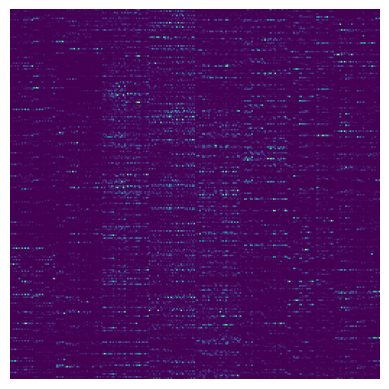

Iteration: 71, Discriminator Loss: 0.873, Generator Loss: 0.616
Iteration: 72, Discriminator Loss: 0.993, Generator Loss: 0.661
Iteration: 73, Discriminator Loss: 0.879, Generator Loss: 0.690
Iteration: 74, Discriminator Loss: 0.786, Generator Loss: 0.691
Iteration: 75, Discriminator Loss: 1.048, Generator Loss: 0.582
Iteration: 76, Discriminator Loss: 0.906, Generator Loss: 0.622
Iteration: 77, Discriminator Loss: 0.917, Generator Loss: 0.678
Iteration: 78, Discriminator Loss: 0.831, Generator Loss: 0.678
Iteration: 79, Discriminator Loss: 0.744, Generator Loss: 0.738
Iteration: 80, Discriminator Loss: 0.767, Generator Loss: 0.726


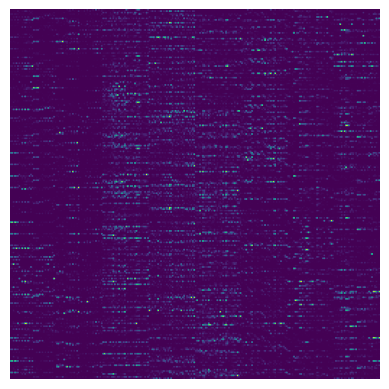

Iteration: 81, Discriminator Loss: 0.732, Generator Loss: 0.738
Iteration: 82, Discriminator Loss: 0.758, Generator Loss: 0.782
Iteration: 83, Discriminator Loss: 0.839, Generator Loss: 0.682
Iteration: 84, Discriminator Loss: 0.676, Generator Loss: 0.744
Iteration: 85, Discriminator Loss: 0.650, Generator Loss: 0.822
Iteration: 86, Discriminator Loss: 0.752, Generator Loss: 0.750
Iteration: 87, Discriminator Loss: 0.688, Generator Loss: 0.776
Iteration: 88, Discriminator Loss: 0.576, Generator Loss: 0.959
Iteration: 89, Discriminator Loss: 0.702, Generator Loss: 0.824
Iteration: 90, Discriminator Loss: 1.141, Generator Loss: 0.710


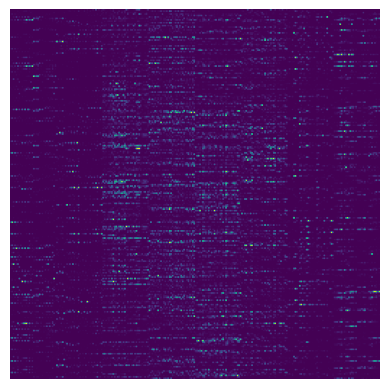

Iteration: 91, Discriminator Loss: 0.658, Generator Loss: 0.865
Iteration: 92, Discriminator Loss: 0.753, Generator Loss: 0.837
Iteration: 93, Discriminator Loss: 0.567, Generator Loss: 0.878
Iteration: 94, Discriminator Loss: 0.545, Generator Loss: 0.943
Iteration: 95, Discriminator Loss: 0.576, Generator Loss: 0.904
Iteration: 96, Discriminator Loss: 0.615, Generator Loss: 0.820
Iteration: 97, Discriminator Loss: 0.481, Generator Loss: 1.059
Iteration: 98, Discriminator Loss: 0.526, Generator Loss: 0.982
Iteration: 99, Discriminator Loss: 0.408, Generator Loss: 1.221
Iteration: 100, Discriminator Loss: 0.513, Generator Loss: 0.985


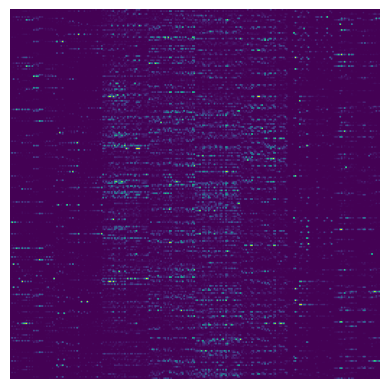

Iteration: 101, Discriminator Loss: 0.483, Generator Loss: 1.069
Iteration: 102, Discriminator Loss: 0.430, Generator Loss: 1.131
Iteration: 103, Discriminator Loss: 0.365, Generator Loss: 1.256
Iteration: 104, Discriminator Loss: 0.647, Generator Loss: 1.213
Iteration: 105, Discriminator Loss: 0.356, Generator Loss: 1.259
Iteration: 106, Discriminator Loss: 0.262, Generator Loss: 1.558
Iteration: 107, Discriminator Loss: 0.390, Generator Loss: 1.215
Iteration: 108, Discriminator Loss: 0.381, Generator Loss: 1.207
Iteration: 109, Discriminator Loss: 0.262, Generator Loss: 1.551
Iteration: 110, Discriminator Loss: 0.421, Generator Loss: 1.183


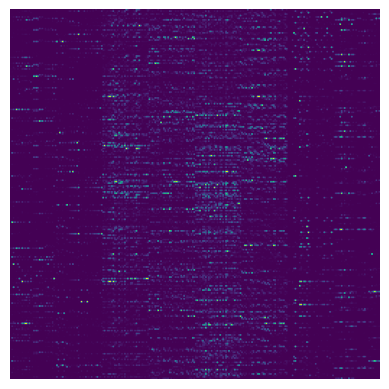

Iteration: 111, Discriminator Loss: 0.574, Generator Loss: 1.389
Iteration: 112, Discriminator Loss: 0.177, Generator Loss: 1.862
Iteration: 113, Discriminator Loss: 0.593, Generator Loss: 1.563
Iteration: 114, Discriminator Loss: 0.201, Generator Loss: 1.798
Iteration: 115, Discriminator Loss: 0.220, Generator Loss: 1.900
Iteration: 116, Discriminator Loss: 0.171, Generator Loss: 1.912
Iteration: 117, Discriminator Loss: 1.199, Generator Loss: 2.054
Iteration: 118, Discriminator Loss: 0.353, Generator Loss: 1.501
Iteration: 119, Discriminator Loss: 0.365, Generator Loss: 1.240
Iteration: 120, Discriminator Loss: 0.220, Generator Loss: 1.672


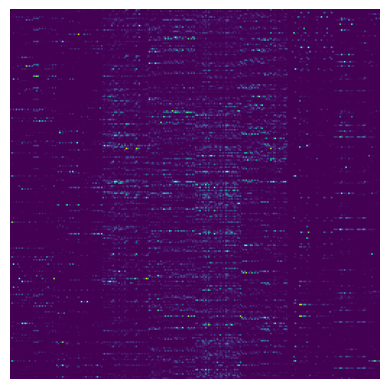

Iteration: 121, Discriminator Loss: 0.143, Generator Loss: 2.072
Iteration: 122, Discriminator Loss: 0.258, Generator Loss: 1.875
Iteration: 123, Discriminator Loss: 3.421, Generator Loss: 1.815
Iteration: 124, Discriminator Loss: 0.304, Generator Loss: 1.428
Iteration: 125, Discriminator Loss: 0.305, Generator Loss: 1.328
Iteration: 126, Discriminator Loss: 0.363, Generator Loss: 1.210
Iteration: 127, Discriminator Loss: 4.803, Generator Loss: 1.507
Iteration: 128, Discriminator Loss: 0.288, Generator Loss: 1.631
Iteration: 129, Discriminator Loss: 0.198, Generator Loss: 1.706
Iteration: 130, Discriminator Loss: 0.375, Generator Loss: 1.171


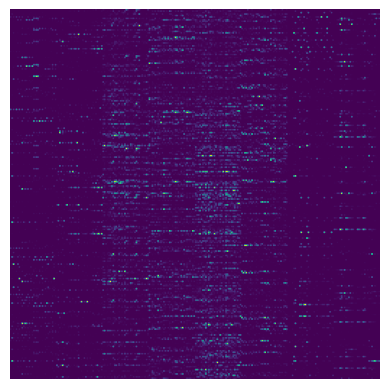

Iteration: 131, Discriminator Loss: 0.262, Generator Loss: 1.504
Iteration: 132, Discriminator Loss: 0.296, Generator Loss: 1.392
Iteration: 133, Discriminator Loss: 0.438, Generator Loss: 1.057
Iteration: 134, Discriminator Loss: 0.211, Generator Loss: 1.775
Iteration: 135, Discriminator Loss: 0.355, Generator Loss: 1.234
Iteration: 136, Discriminator Loss: 0.312, Generator Loss: 1.349
Iteration: 137, Discriminator Loss: 0.351, Generator Loss: 1.253
Iteration: 138, Discriminator Loss: 0.326, Generator Loss: 1.304
Iteration: 139, Discriminator Loss: 0.429, Generator Loss: 1.117
Iteration: 140, Discriminator Loss: 0.194, Generator Loss: 1.828


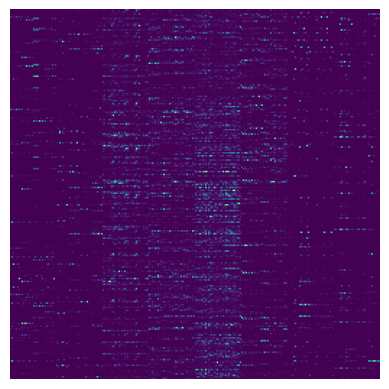

Iteration: 141, Discriminator Loss: 0.363, Generator Loss: 1.292
Iteration: 142, Discriminator Loss: 0.243, Generator Loss: 1.576
Iteration: 143, Discriminator Loss: 0.410, Generator Loss: 1.310
Iteration: 144, Discriminator Loss: 0.280, Generator Loss: 1.482
Iteration: 145, Discriminator Loss: 0.231, Generator Loss: 1.612
Iteration: 146, Discriminator Loss: 0.242, Generator Loss: 1.565
Iteration: 147, Discriminator Loss: 0.248, Generator Loss: 1.549
Iteration: 148, Discriminator Loss: 0.226, Generator Loss: 1.693
Iteration: 149, Discriminator Loss: 0.161, Generator Loss: 1.947
Iteration: 150, Discriminator Loss: 1.389, Generator Loss: 1.649


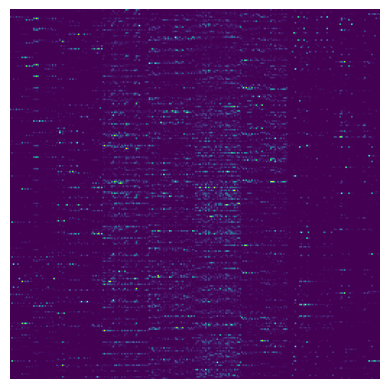

Iteration: 151, Discriminator Loss: 0.381, Generator Loss: 1.130
Iteration: 152, Discriminator Loss: 0.328, Generator Loss: 1.341
Iteration: 153, Discriminator Loss: 0.206, Generator Loss: 1.716
Iteration: 154, Discriminator Loss: 0.277, Generator Loss: 1.445
Iteration: 155, Discriminator Loss: 0.355, Generator Loss: 1.476
Iteration: 156, Discriminator Loss: 0.226, Generator Loss: 1.621
Iteration: 157, Discriminator Loss: 0.217, Generator Loss: 1.693
Iteration: 158, Discriminator Loss: 0.087, Generator Loss: 2.528
Iteration: 159, Discriminator Loss: 0.182, Generator Loss: 1.833
Iteration: 160, Discriminator Loss: 0.378, Generator Loss: 1.184


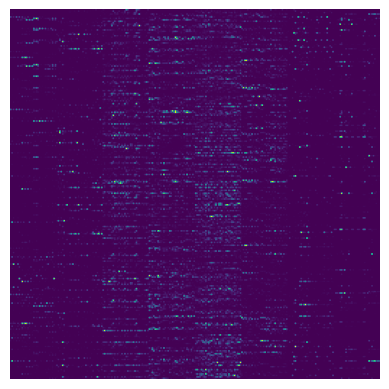

Iteration: 161, Discriminator Loss: 0.145, Generator Loss: 2.041
Iteration: 162, Discriminator Loss: 0.067, Generator Loss: 2.771
Iteration: 163, Discriminator Loss: 0.119, Generator Loss: 2.247
Iteration: 164, Discriminator Loss: 0.352, Generator Loss: 1.233
Iteration: 165, Discriminator Loss: 0.126, Generator Loss: 2.162
Iteration: 166, Discriminator Loss: 0.475, Generator Loss: 1.380
Iteration: 167, Discriminator Loss: 0.213, Generator Loss: 1.681
Iteration: 168, Discriminator Loss: 2.839, Generator Loss: 1.375
Iteration: 169, Discriminator Loss: 0.217, Generator Loss: 2.287
Iteration: 170, Discriminator Loss: 0.237, Generator Loss: 1.553


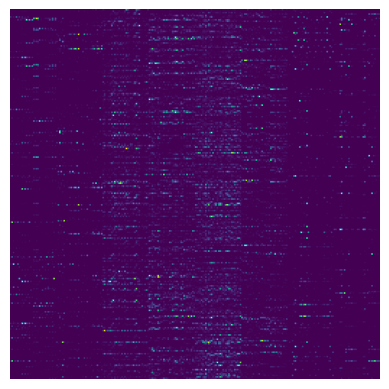

Iteration: 171, Discriminator Loss: 0.161, Generator Loss: 1.907
Iteration: 172, Discriminator Loss: 0.283, Generator Loss: 1.413
Iteration: 173, Discriminator Loss: 0.157, Generator Loss: 1.949
Iteration: 174, Discriminator Loss: 0.151, Generator Loss: 2.239
Iteration: 175, Discriminator Loss: 0.632, Generator Loss: 0.776
Iteration: 176, Discriminator Loss: 0.086, Generator Loss: 2.534
Iteration: 177, Discriminator Loss: 0.224, Generator Loss: 2.014
Iteration: 178, Discriminator Loss: 0.170, Generator Loss: 1.880
Iteration: 179, Discriminator Loss: 0.263, Generator Loss: 1.485
Iteration: 180, Discriminator Loss: 0.284, Generator Loss: 1.422


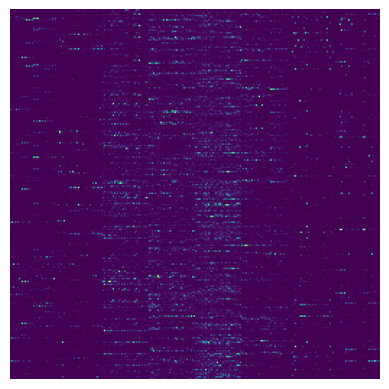

Iteration: 181, Discriminator Loss: 0.221, Generator Loss: 1.642
Iteration: 182, Discriminator Loss: 0.051, Generator Loss: 3.026
Iteration: 183, Discriminator Loss: 0.074, Generator Loss: 2.667
Iteration: 184, Discriminator Loss: 0.128, Generator Loss: 2.583
Iteration: 185, Discriminator Loss: 0.215, Generator Loss: 2.594
Iteration: 186, Discriminator Loss: 0.105, Generator Loss: 2.322
Iteration: 187, Discriminator Loss: 0.059, Generator Loss: 2.884
Iteration: 188, Discriminator Loss: 0.341, Generator Loss: 1.260
Iteration: 189, Discriminator Loss: 0.122, Generator Loss: 2.188
Iteration: 190, Discriminator Loss: 0.073, Generator Loss: 2.684


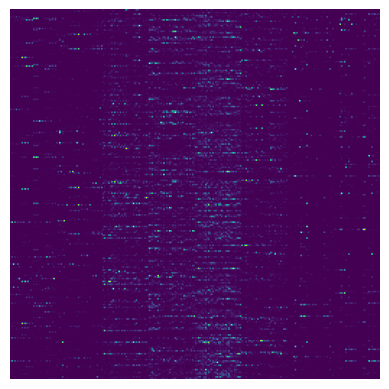

Iteration: 191, Discriminator Loss: 0.381, Generator Loss: 1.230
Iteration: 192, Discriminator Loss: 0.061, Generator Loss: 2.849
Iteration: 193, Discriminator Loss: 0.165, Generator Loss: 1.906
Iteration: 194, Discriminator Loss: 0.046, Generator Loss: 3.137
Iteration: 195, Discriminator Loss: 0.065, Generator Loss: 2.792
Iteration: 196, Discriminator Loss: 0.273, Generator Loss: 1.450
Iteration: 197, Discriminator Loss: 1.604, Generator Loss: 1.796
Iteration: 198, Discriminator Loss: 0.136, Generator Loss: 2.049
Iteration: 199, Discriminator Loss: 0.230, Generator Loss: 1.585
Iteration: 200, Discriminator Loss: 0.052, Generator Loss: 2.994


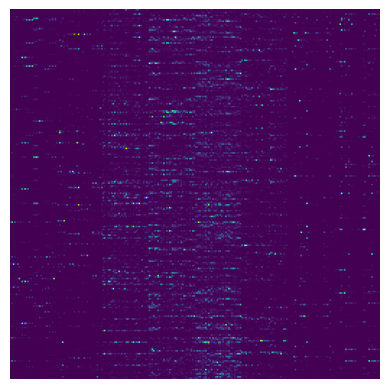

Iteration: 201, Discriminator Loss: 0.144, Generator Loss: 2.023
Iteration: 202, Discriminator Loss: 0.074, Generator Loss: 2.658
Iteration: 203, Discriminator Loss: 0.321, Generator Loss: 1.427
Iteration: 204, Discriminator Loss: 0.128, Generator Loss: 2.138
Iteration: 205, Discriminator Loss: 0.046, Generator Loss: 3.122
Iteration: 206, Discriminator Loss: 0.175, Generator Loss: 1.855
Iteration: 207, Discriminator Loss: 0.023, Generator Loss: 3.792
Iteration: 208, Discriminator Loss: 0.083, Generator Loss: 2.546
Iteration: 209, Discriminator Loss: 0.050, Generator Loss: 3.034
Iteration: 210, Discriminator Loss: 0.047, Generator Loss: 3.094


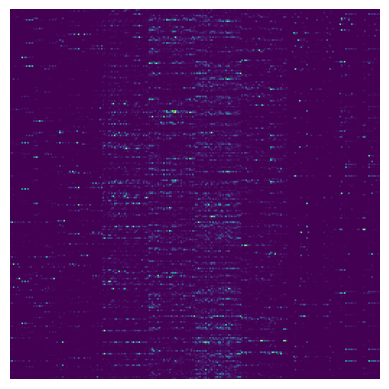

Iteration: 211, Discriminator Loss: 0.088, Generator Loss: 2.493
Iteration: 212, Discriminator Loss: 2.257, Generator Loss: 2.030
Iteration: 213, Discriminator Loss: 0.054, Generator Loss: 2.913
Iteration: 214, Discriminator Loss: 0.132, Generator Loss: 2.084
Iteration: 215, Discriminator Loss: 0.024, Generator Loss: 3.733
Iteration: 216, Discriminator Loss: 0.096, Generator Loss: 2.403
Iteration: 217, Discriminator Loss: 0.149, Generator Loss: 1.999
Iteration: 218, Discriminator Loss: 0.064, Generator Loss: 2.798
Iteration: 219, Discriminator Loss: 0.129, Generator Loss: 2.180
Iteration: 220, Discriminator Loss: 0.210, Generator Loss: 1.683


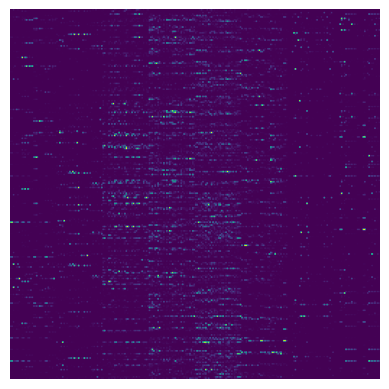

Iteration: 221, Discriminator Loss: 0.079, Generator Loss: 2.634
Iteration: 222, Discriminator Loss: 0.170, Generator Loss: 1.934
Iteration: 223, Discriminator Loss: 0.082, Generator Loss: 2.570
Iteration: 224, Discriminator Loss: 0.197, Generator Loss: 1.746
Iteration: 225, Discriminator Loss: 0.181, Generator Loss: 1.822
Iteration: 226, Discriminator Loss: 0.035, Generator Loss: 3.394
Iteration: 227, Discriminator Loss: 0.116, Generator Loss: 2.234
Iteration: 228, Discriminator Loss: 0.225, Generator Loss: 1.624
Iteration: 229, Discriminator Loss: 0.046, Generator Loss: 3.127
Iteration: 230, Discriminator Loss: 0.083, Generator Loss: 2.555


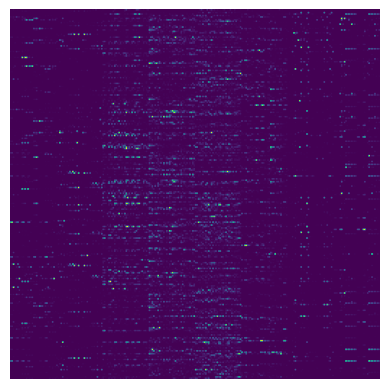

Iteration: 231, Discriminator Loss: 0.314, Generator Loss: 1.678
Iteration: 232, Discriminator Loss: 0.061, Generator Loss: 2.855
Iteration: 233, Discriminator Loss: 0.093, Generator Loss: 2.442
Iteration: 234, Discriminator Loss: 0.144, Generator Loss: 2.163
Iteration: 235, Discriminator Loss: 0.022, Generator Loss: 3.839
Iteration: 236, Discriminator Loss: 2.723, Generator Loss: 2.879
Iteration: 237, Discriminator Loss: 0.619, Generator Loss: 2.002
Iteration: 238, Discriminator Loss: 0.108, Generator Loss: 2.236
Iteration: 239, Discriminator Loss: 0.151, Generator Loss: 1.959
Iteration: 240, Discriminator Loss: 0.131, Generator Loss: 2.100


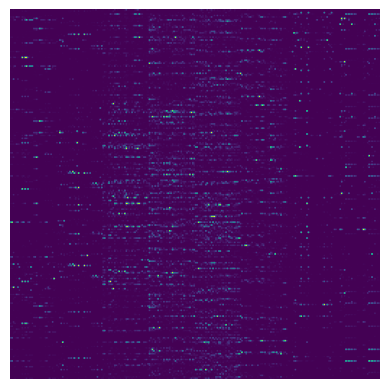

Iteration: 241, Discriminator Loss: 1.306, Generator Loss: 1.633
Iteration: 242, Discriminator Loss: 6.940, Generator Loss: 2.396
Iteration: 243, Discriminator Loss: 0.269, Generator Loss: 1.384
Iteration: 244, Discriminator Loss: 0.177, Generator Loss: 1.788
Iteration: 245, Discriminator Loss: 0.183, Generator Loss: 1.782
Iteration: 246, Discriminator Loss: 0.135, Generator Loss: 2.081
Iteration: 247, Discriminator Loss: 0.201, Generator Loss: 1.714
Iteration: 248, Discriminator Loss: 0.079, Generator Loss: 2.588
Iteration: 249, Discriminator Loss: 0.173, Generator Loss: 1.853
Iteration: 250, Discriminator Loss: 0.160, Generator Loss: 1.925


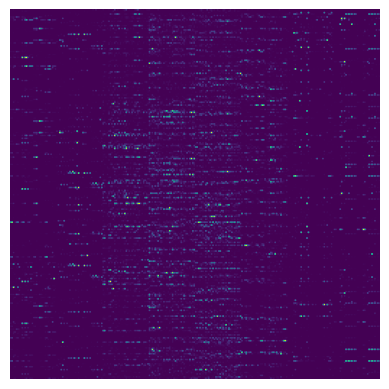

Iteration: 251, Discriminator Loss: 6.075, Generator Loss: 1.323
Iteration: 252, Discriminator Loss: 0.365, Generator Loss: 1.146
Iteration: 253, Discriminator Loss: 0.280, Generator Loss: 1.392
Iteration: 254, Discriminator Loss: 0.165, Generator Loss: 1.910
Iteration: 255, Discriminator Loss: 0.200, Generator Loss: 1.712
Iteration: 256, Discriminator Loss: 0.374, Generator Loss: 1.179
Iteration: 257, Discriminator Loss: 0.349, Generator Loss: 1.247
Iteration: 258, Discriminator Loss: 0.224, Generator Loss: 1.620
Iteration: 259, Discriminator Loss: 0.541, Generator Loss: 1.753
Iteration: 260, Discriminator Loss: 0.221, Generator Loss: 1.627


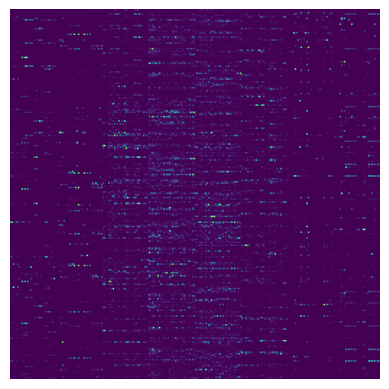

Iteration: 261, Discriminator Loss: 0.225, Generator Loss: 1.615
Iteration: 262, Discriminator Loss: 0.100, Generator Loss: 2.373
Iteration: 263, Discriminator Loss: 0.120, Generator Loss: 2.195
Iteration: 264, Discriminator Loss: 0.041, Generator Loss: 3.231
Iteration: 265, Discriminator Loss: 0.297, Generator Loss: 1.370
Iteration: 266, Discriminator Loss: 0.363, Generator Loss: 1.206
Iteration: 267, Discriminator Loss: 0.382, Generator Loss: 1.160
Iteration: 268, Discriminator Loss: 0.308, Generator Loss: 1.343
Iteration: 269, Discriminator Loss: 0.087, Generator Loss: 2.503
Iteration: 270, Discriminator Loss: 0.089, Generator Loss: 2.474


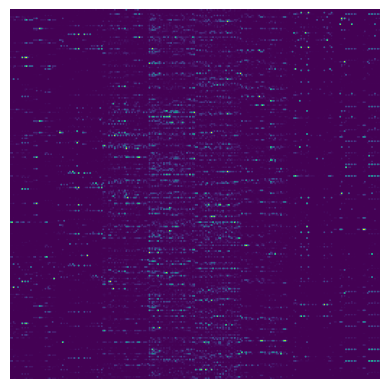

Iteration: 271, Discriminator Loss: 0.160, Generator Loss: 1.930
Iteration: 272, Discriminator Loss: 0.232, Generator Loss: 1.589
Iteration: 273, Discriminator Loss: 0.213, Generator Loss: 1.671
Iteration: 274, Discriminator Loss: 0.233, Generator Loss: 1.588
Iteration: 275, Discriminator Loss: 0.280, Generator Loss: 1.426
Iteration: 276, Discriminator Loss: 0.241, Generator Loss: 1.557
Iteration: 277, Discriminator Loss: 0.135, Generator Loss: 2.097
Iteration: 278, Discriminator Loss: 0.139, Generator Loss: 2.058
Iteration: 279, Discriminator Loss: 0.248, Generator Loss: 1.529
Iteration: 280, Discriminator Loss: 0.080, Generator Loss: 2.583


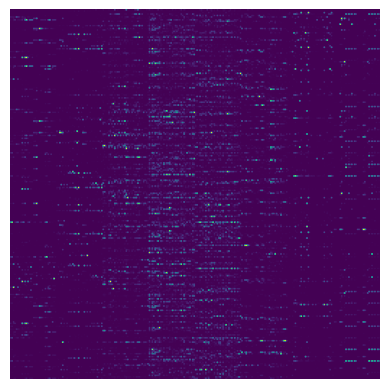

Iteration: 281, Discriminator Loss: 0.110, Generator Loss: 2.301
Iteration: 282, Discriminator Loss: 0.215, Generator Loss: 1.659
Iteration: 283, Discriminator Loss: 0.150, Generator Loss: 1.989
Iteration: 284, Discriminator Loss: 0.077, Generator Loss: 2.622
Iteration: 285, Discriminator Loss: 0.105, Generator Loss: 2.322
Iteration: 286, Discriminator Loss: 0.377, Generator Loss: 1.173
Iteration: 287, Discriminator Loss: 0.110, Generator Loss: 2.283
Iteration: 288, Discriminator Loss: 0.031, Generator Loss: 3.497
Iteration: 289, Discriminator Loss: 0.287, Generator Loss: 1.400
Iteration: 290, Discriminator Loss: 0.213, Generator Loss: 1.669


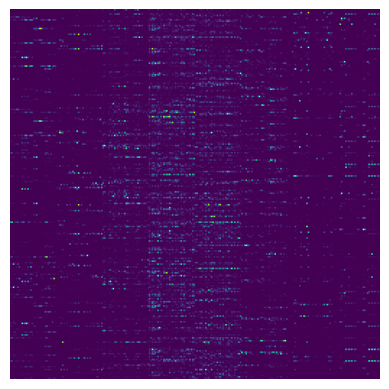

Iteration: 291, Discriminator Loss: 0.051, Generator Loss: 3.031
Iteration: 292, Discriminator Loss: 0.070, Generator Loss: 2.710
Iteration: 293, Discriminator Loss: 0.208, Generator Loss: 1.686
Iteration: 294, Discriminator Loss: 0.062, Generator Loss: 2.838
Iteration: 295, Discriminator Loss: 0.142, Generator Loss: 2.040
Iteration: 296, Discriminator Loss: 0.436, Generator Loss: 1.056
Iteration: 297, Discriminator Loss: 0.430, Generator Loss: 1.067
Iteration: 298, Discriminator Loss: 0.246, Generator Loss: 1.539
Iteration: 299, Discriminator Loss: 0.042, Generator Loss: 3.233
Iteration: 300, Discriminator Loss: 0.126, Generator Loss: 2.155


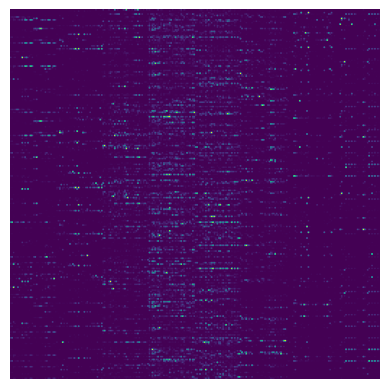

Iteration: 301, Discriminator Loss: 0.272, Generator Loss: 1.452
Iteration: 302, Discriminator Loss: 0.169, Generator Loss: 1.880
Iteration: 303, Discriminator Loss: 0.007, Generator Loss: 5.031
Iteration: 304, Discriminator Loss: 0.197, Generator Loss: 1.736
Iteration: 305, Discriminator Loss: 0.065, Generator Loss: 2.787
Iteration: 306, Discriminator Loss: 0.095, Generator Loss: 2.414
Iteration: 307, Discriminator Loss: 0.088, Generator Loss: 2.492
Iteration: 308, Discriminator Loss: 0.175, Generator Loss: 1.841
Iteration: 309, Discriminator Loss: 0.153, Generator Loss: 1.968
Iteration: 310, Discriminator Loss: 0.105, Generator Loss: 2.324


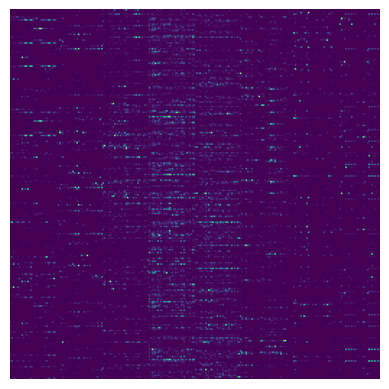

Iteration: 311, Discriminator Loss: 0.040, Generator Loss: 3.248
Iteration: 312, Discriminator Loss: 0.033, Generator Loss: 3.441
Iteration: 313, Discriminator Loss: 0.138, Generator Loss: 2.064
Iteration: 314, Discriminator Loss: 0.140, Generator Loss: 2.170
Iteration: 315, Discriminator Loss: 0.024, Generator Loss: 3.767
Iteration: 316, Discriminator Loss: 0.114, Generator Loss: 2.239
Iteration: 317, Discriminator Loss: 0.070, Generator Loss: 2.713
Iteration: 318, Discriminator Loss: 0.013, Generator Loss: 4.429
Iteration: 319, Discriminator Loss: 0.095, Generator Loss: 2.413
Iteration: 320, Discriminator Loss: 0.158, Generator Loss: 1.971


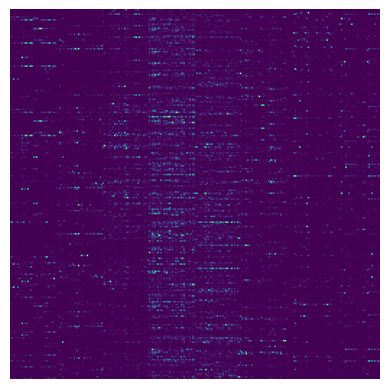

Iteration: 321, Discriminator Loss: 0.044, Generator Loss: 3.164
Iteration: 322, Discriminator Loss: 0.144, Generator Loss: 2.027
Iteration: 323, Discriminator Loss: 0.026, Generator Loss: 3.670
Iteration: 324, Discriminator Loss: 0.071, Generator Loss: 2.688
Iteration: 325, Discriminator Loss: 0.393, Generator Loss: 1.139
Iteration: 326, Discriminator Loss: 0.340, Generator Loss: 2.947
Iteration: 327, Discriminator Loss: 0.039, Generator Loss: 3.277
Iteration: 328, Discriminator Loss: 0.122, Generator Loss: 2.177
Iteration: 329, Discriminator Loss: 0.020, Generator Loss: 3.924
Iteration: 330, Discriminator Loss: 0.082, Generator Loss: 2.548


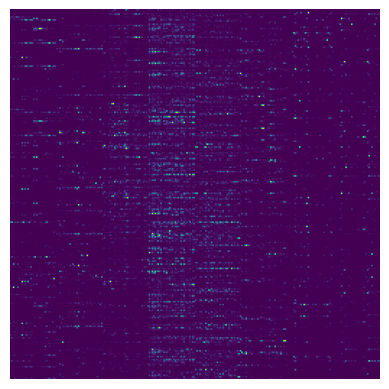

Iteration: 331, Discriminator Loss: 0.040, Generator Loss: 3.276
Iteration: 332, Discriminator Loss: 0.174, Generator Loss: 1.846
Iteration: 333, Discriminator Loss: 0.099, Generator Loss: 2.381
Iteration: 334, Discriminator Loss: 0.088, Generator Loss: 2.493
Iteration: 335, Discriminator Loss: 0.046, Generator Loss: 3.107
Iteration: 336, Discriminator Loss: 0.122, Generator Loss: 2.482
Iteration: 337, Discriminator Loss: 0.072, Generator Loss: 3.363
Iteration: 338, Discriminator Loss: 0.116, Generator Loss: 2.225
Iteration: 339, Discriminator Loss: 0.118, Generator Loss: 2.213
Iteration: 340, Discriminator Loss: 0.074, Generator Loss: 2.654


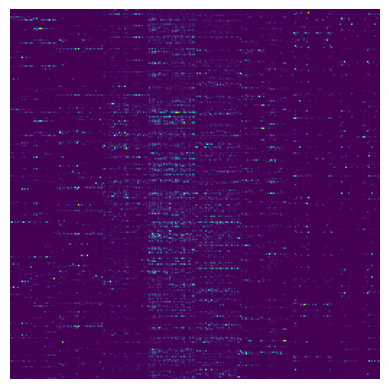

Iteration: 341, Discriminator Loss: 0.052, Generator Loss: 2.996
Iteration: 342, Discriminator Loss: 14.899, Generator Loss: 2.066
Iteration: 343, Discriminator Loss: 0.058, Generator Loss: 2.665
Iteration: 344, Discriminator Loss: 0.293, Generator Loss: 1.324
Iteration: 345, Discriminator Loss: 0.380, Generator Loss: 1.139
Iteration: 346, Discriminator Loss: 0.327, Generator Loss: 1.280
Iteration: 347, Discriminator Loss: 0.045, Generator Loss: 3.121
Iteration: 348, Discriminator Loss: 20.425, Generator Loss: 1.787
Iteration: 349, Discriminator Loss: 0.342, Generator Loss: 1.177
Iteration: 350, Discriminator Loss: 0.271, Generator Loss: 1.409


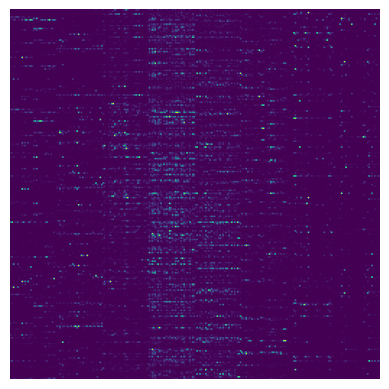

Iteration: 351, Discriminator Loss: 0.190, Generator Loss: 1.740
Iteration: 352, Discriminator Loss: 0.053, Generator Loss: 2.944
Iteration: 353, Discriminator Loss: 5.343, Generator Loss: 1.447
Iteration: 354, Discriminator Loss: 0.513, Generator Loss: 0.906
Iteration: 355, Discriminator Loss: 0.320, Generator Loss: 1.292
Iteration: 356, Discriminator Loss: 0.440, Generator Loss: 1.036
Iteration: 357, Discriminator Loss: 0.446, Generator Loss: 1.029
Iteration: 358, Discriminator Loss: 0.283, Generator Loss: 1.412
Iteration: 359, Discriminator Loss: 0.200, Generator Loss: 1.717
Iteration: 360, Discriminator Loss: 0.219, Generator Loss: 1.638


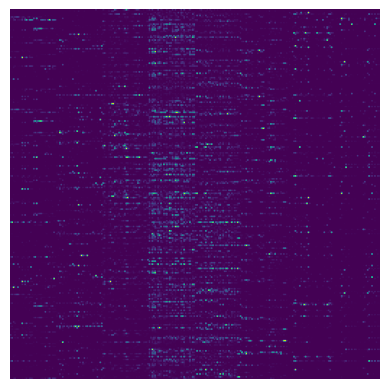

Iteration: 361, Discriminator Loss: 0.224, Generator Loss: 1.616
Iteration: 362, Discriminator Loss: 0.446, Generator Loss: 1.031
Iteration: 363, Discriminator Loss: 0.206, Generator Loss: 1.695
Iteration: 364, Discriminator Loss: 0.199, Generator Loss: 1.725
Iteration: 365, Discriminator Loss: 0.135, Generator Loss: 2.080
Iteration: 366, Discriminator Loss: 0.157, Generator Loss: 1.943
Iteration: 367, Discriminator Loss: 0.086, Generator Loss: 2.511
Iteration: 368, Discriminator Loss: 0.224, Generator Loss: 1.615
Iteration: 369, Discriminator Loss: 0.127, Generator Loss: 2.138
Iteration: 370, Discriminator Loss: 0.280, Generator Loss: 1.451


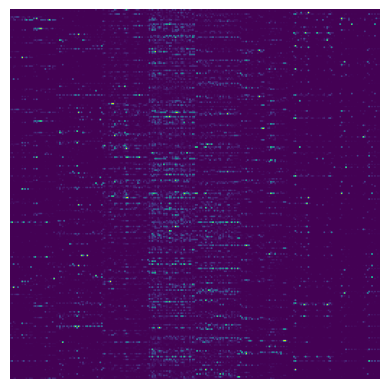

Iteration: 371, Discriminator Loss: 0.085, Generator Loss: 2.536
Iteration: 372, Discriminator Loss: 0.321, Generator Loss: 1.299
Iteration: 373, Discriminator Loss: 0.499, Generator Loss: 0.945
Iteration: 374, Discriminator Loss: 0.332, Generator Loss: 1.278
Iteration: 375, Discriminator Loss: 0.150, Generator Loss: 1.984
Iteration: 376, Discriminator Loss: 0.104, Generator Loss: 2.334
Iteration: 377, Discriminator Loss: 0.057, Generator Loss: 2.909
Iteration: 378, Discriminator Loss: 0.352, Generator Loss: 1.285
Iteration: 379, Discriminator Loss: 0.307, Generator Loss: 1.341
Iteration: 380, Discriminator Loss: 0.144, Generator Loss: 2.023


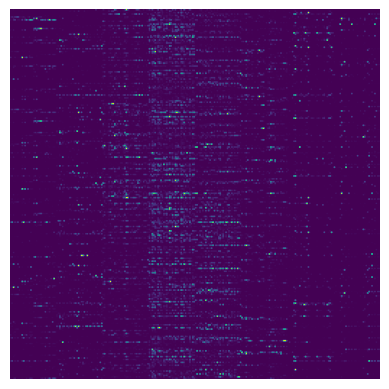

Iteration: 381, Discriminator Loss: 0.084, Generator Loss: 2.528
Iteration: 382, Discriminator Loss: 0.108, Generator Loss: 2.286
Iteration: 383, Discriminator Loss: 0.090, Generator Loss: 2.464
Iteration: 384, Discriminator Loss: 0.372, Generator Loss: 1.179
Iteration: 385, Discriminator Loss: 0.110, Generator Loss: 2.270
Iteration: 386, Discriminator Loss: 0.465, Generator Loss: 1.371
Iteration: 387, Discriminator Loss: 0.061, Generator Loss: 2.863
Iteration: 388, Discriminator Loss: 0.195, Generator Loss: 1.738
Iteration: 389, Discriminator Loss: 0.264, Generator Loss: 1.471
Iteration: 390, Discriminator Loss: 0.484, Generator Loss: 0.970


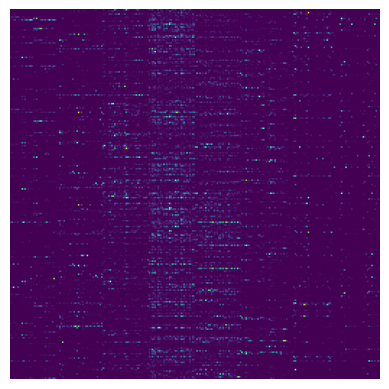

Iteration: 391, Discriminator Loss: 0.232, Generator Loss: 1.589
Iteration: 392, Discriminator Loss: 0.063, Generator Loss: 2.813
Iteration: 393, Discriminator Loss: 0.054, Generator Loss: 2.958
Iteration: 394, Discriminator Loss: 0.040, Generator Loss: 3.249
Iteration: 395, Discriminator Loss: 0.123, Generator Loss: 2.167
Iteration: 396, Discriminator Loss: 0.048, Generator Loss: 3.064
Iteration: 397, Discriminator Loss: 0.142, Generator Loss: 2.034
Iteration: 398, Discriminator Loss: 0.228, Generator Loss: 1.602
Iteration: 399, Discriminator Loss: 0.063, Generator Loss: 2.807
Iteration: 400, Discriminator Loss: 0.263, Generator Loss: 1.491


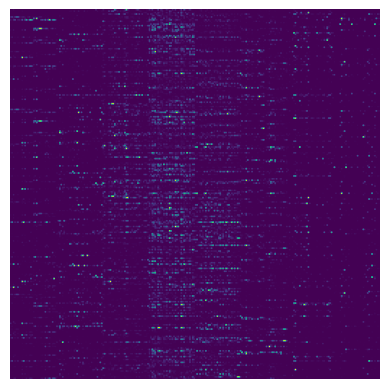

Iteration: 401, Discriminator Loss: 0.229, Generator Loss: 1.596
Iteration: 402, Discriminator Loss: 0.117, Generator Loss: 2.216
Iteration: 403, Discriminator Loss: 0.128, Generator Loss: 2.128
Iteration: 404, Discriminator Loss: 0.074, Generator Loss: 2.656
Iteration: 405, Discriminator Loss: 0.164, Generator Loss: 1.900
Iteration: 406, Discriminator Loss: 7.619, Generator Loss: 2.067
Iteration: 407, Discriminator Loss: 0.083, Generator Loss: 2.444
Iteration: 408, Discriminator Loss: 0.193, Generator Loss: 1.852
Iteration: 409, Discriminator Loss: 0.252, Generator Loss: 1.496
Iteration: 410, Discriminator Loss: 0.325, Generator Loss: 1.288


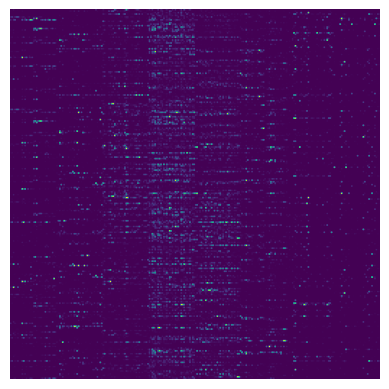

Iteration: 411, Discriminator Loss: 0.131, Generator Loss: 2.104
Iteration: 412, Discriminator Loss: 0.255, Generator Loss: 1.562
Iteration: 413, Discriminator Loss: 0.070, Generator Loss: 2.714
Iteration: 414, Discriminator Loss: 0.093, Generator Loss: 2.433
Iteration: 415, Discriminator Loss: 0.079, Generator Loss: 2.589
Iteration: 416, Discriminator Loss: 0.062, Generator Loss: 2.817
Iteration: 417, Discriminator Loss: 0.083, Generator Loss: 2.541
Iteration: 418, Discriminator Loss: 0.274, Generator Loss: 1.436
Iteration: 419, Discriminator Loss: 0.088, Generator Loss: 2.488
Iteration: 420, Discriminator Loss: 0.186, Generator Loss: 1.786


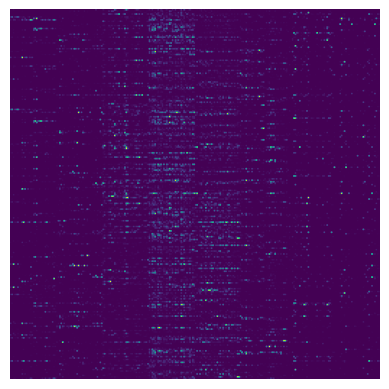

Iteration: 421, Discriminator Loss: 0.282, Generator Loss: 1.414
Iteration: 422, Discriminator Loss: 0.197, Generator Loss: 1.733
Iteration: 423, Discriminator Loss: 0.237, Generator Loss: 1.571
Iteration: 424, Discriminator Loss: 0.431, Generator Loss: 1.062
Iteration: 425, Discriminator Loss: 0.331, Generator Loss: 1.277
Iteration: 426, Discriminator Loss: 0.215, Generator Loss: 1.668
Iteration: 427, Discriminator Loss: 0.079, Generator Loss: 2.593
Iteration: 428, Discriminator Loss: 0.259, Generator Loss: 1.489
Iteration: 429, Discriminator Loss: 0.370, Generator Loss: 1.183
Iteration: 430, Discriminator Loss: 0.108, Generator Loss: 2.295


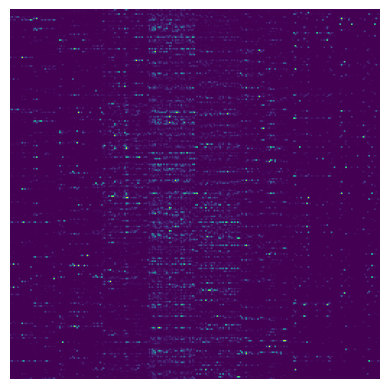

Iteration: 431, Discriminator Loss: 0.083, Generator Loss: 2.562
Iteration: 432, Discriminator Loss: 0.196, Generator Loss: 1.739
Iteration: 433, Discriminator Loss: 0.210, Generator Loss: 1.673
Iteration: 434, Discriminator Loss: 0.146, Generator Loss: 2.008
Iteration: 435, Discriminator Loss: 0.314, Generator Loss: 1.632
Iteration: 436, Discriminator Loss: 0.088, Generator Loss: 2.491
Iteration: 437, Discriminator Loss: 0.167, Generator Loss: 1.881
Iteration: 438, Discriminator Loss: 0.174, Generator Loss: 1.845
Iteration: 439, Discriminator Loss: 0.206, Generator Loss: 1.720
Iteration: 440, Discriminator Loss: 0.306, Generator Loss: 1.345


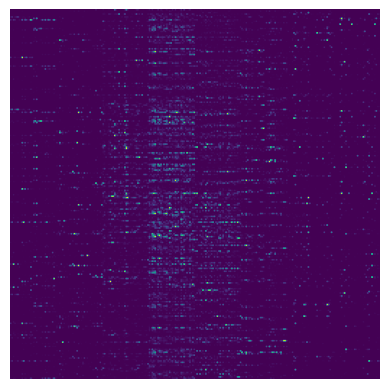

Iteration: 441, Discriminator Loss: 0.167, Generator Loss: 1.885
Iteration: 442, Discriminator Loss: 0.058, Generator Loss: 2.943
Iteration: 443, Discriminator Loss: 0.200, Generator Loss: 1.717
Iteration: 444, Discriminator Loss: 0.091, Generator Loss: 2.453
Iteration: 445, Discriminator Loss: 0.124, Generator Loss: 2.162
Iteration: 446, Discriminator Loss: 0.016, Generator Loss: 4.155
Iteration: 447, Discriminator Loss: 0.064, Generator Loss: 2.797
Iteration: 448, Discriminator Loss: 0.309, Generator Loss: 1.333
Iteration: 449, Discriminator Loss: 0.345, Generator Loss: 1.249
Iteration: 450, Discriminator Loss: 0.042, Generator Loss: 3.212


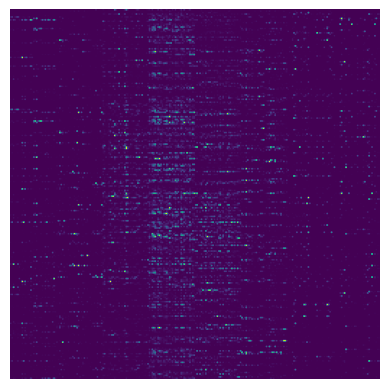

Iteration: 451, Discriminator Loss: 0.149, Generator Loss: 1.990
Iteration: 452, Discriminator Loss: 0.164, Generator Loss: 1.907
Iteration: 453, Discriminator Loss: 0.205, Generator Loss: 1.695
Iteration: 454, Discriminator Loss: 0.051, Generator Loss: 3.007
Iteration: 455, Discriminator Loss: 0.160, Generator Loss: 1.925
Iteration: 456, Discriminator Loss: 0.168, Generator Loss: 1.882
Iteration: 457, Discriminator Loss: 0.069, Generator Loss: 2.720
Iteration: 458, Discriminator Loss: 0.047, Generator Loss: 3.105
Iteration: 459, Discriminator Loss: 0.104, Generator Loss: 2.322
Iteration: 460, Discriminator Loss: 0.196, Generator Loss: 1.738


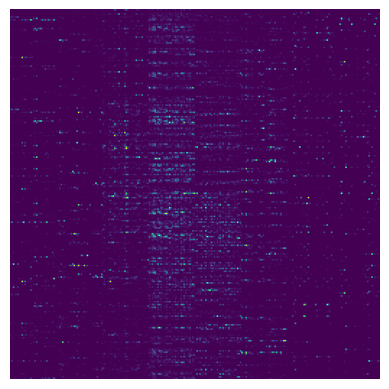

Iteration: 461, Discriminator Loss: 0.015, Generator Loss: 4.200
Iteration: 462, Discriminator Loss: 0.236, Generator Loss: 1.572
Iteration: 463, Discriminator Loss: 0.052, Generator Loss: 2.996
Iteration: 464, Discriminator Loss: 0.042, Generator Loss: 3.202
Iteration: 465, Discriminator Loss: 0.046, Generator Loss: 3.102
Iteration: 466, Discriminator Loss: 0.053, Generator Loss: 2.982
Iteration: 467, Discriminator Loss: 0.088, Generator Loss: 2.490
Iteration: 468, Discriminator Loss: 0.102, Generator Loss: 2.348
Iteration: 469, Discriminator Loss: 0.222, Generator Loss: 1.961
Iteration: 470, Discriminator Loss: 1.261, Generator Loss: 2.315


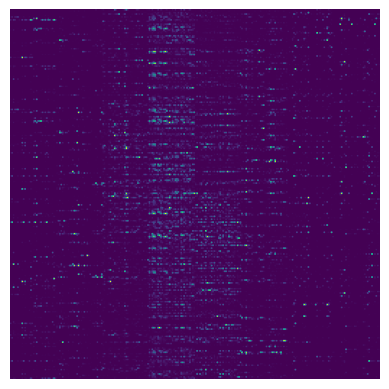

Iteration: 471, Discriminator Loss: 0.037, Generator Loss: 3.297
Iteration: 472, Discriminator Loss: 0.116, Generator Loss: 2.205
Iteration: 473, Discriminator Loss: 0.072, Generator Loss: 2.863
Iteration: 474, Discriminator Loss: 0.085, Generator Loss: 2.512
Iteration: 475, Discriminator Loss: 0.122, Generator Loss: 2.174
Iteration: 476, Discriminator Loss: 0.046, Generator Loss: 3.119
Iteration: 477, Discriminator Loss: 0.211, Generator Loss: 1.691
Iteration: 478, Discriminator Loss: 0.100, Generator Loss: 2.368
Iteration: 479, Discriminator Loss: 0.015, Generator Loss: 4.239
Iteration: 480, Discriminator Loss: 0.231, Generator Loss: 1.591


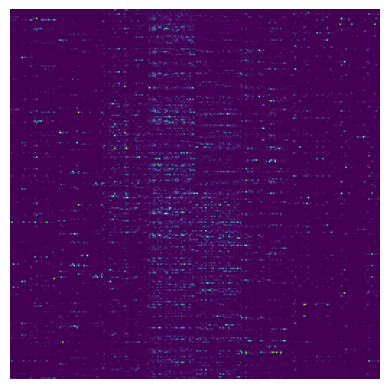

Iteration: 481, Discriminator Loss: 0.163, Generator Loss: 1.908
Iteration: 482, Discriminator Loss: 0.059, Generator Loss: 2.870
Iteration: 483, Discriminator Loss: 0.069, Generator Loss: 2.872
Iteration: 484, Discriminator Loss: 0.107, Generator Loss: 2.298
Iteration: 485, Discriminator Loss: 0.056, Generator Loss: 2.924
Iteration: 486, Discriminator Loss: 0.135, Generator Loss: 2.078
Iteration: 487, Discriminator Loss: 6.013, Generator Loss: 3.481
Iteration: 488, Discriminator Loss: 0.121, Generator Loss: 2.099
Iteration: 489, Discriminator Loss: 0.087, Generator Loss: 2.457
Iteration: 490, Discriminator Loss: 0.050, Generator Loss: 2.998


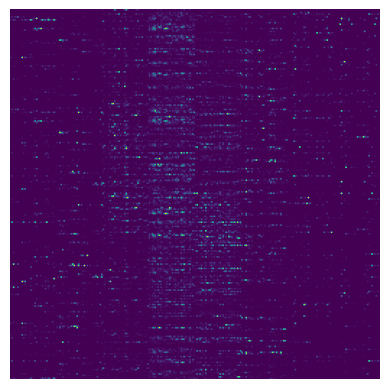

Iteration: 491, Discriminator Loss: 0.169, Generator Loss: 1.864
Iteration: 492, Discriminator Loss: 0.115, Generator Loss: 2.224
Iteration: 493, Discriminator Loss: 0.032, Generator Loss: 3.469
Iteration: 494, Discriminator Loss: 0.142, Generator Loss: 2.036
Iteration: 495, Discriminator Loss: 0.140, Generator Loss: 2.049
Iteration: 496, Discriminator Loss: 0.100, Generator Loss: 2.362
Iteration: 497, Discriminator Loss: 0.106, Generator Loss: 2.321
Iteration: 498, Discriminator Loss: 0.130, Generator Loss: 2.114
Iteration: 499, Discriminator Loss: 0.187, Generator Loss: 1.781
Iteration: 500, Discriminator Loss: 0.115, Generator Loss: 2.233


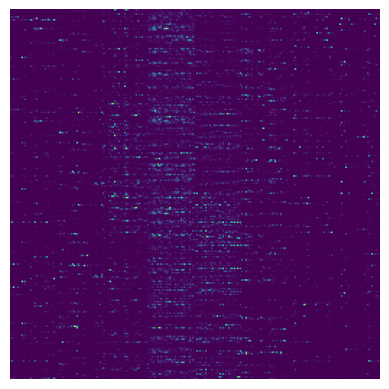

In [12]:
discriminator = Discriminator().to(device)
generator = PatchQuantumGenerator(latent_size, image_size).to(device)

# Binary cross entropy
criterion = nn.BCELoss()

# Optimisers
optD = optim.Adam(discriminator.parameters(), lr=lrD, betas=[0.5, 0.999])
optG = optim.Adam(generator.parameters(), lr=lrG, betas=[0.5, 0.999])

real_labels = torch.full((batch_size,), 1.0, dtype=torch.float, device=device)
fake_labels = torch.full((batch_size,), 0.0, dtype=torch.float, device=device)

# Fixed noise allows us to visually track the generated images throughout training
fixed_noise = (torch.rand(1, latent_size, device=device) * 2 - 1) * math.pi

# Iteration counter
counter = 0

# Collect images for plotting later
results = []

while True:
    for i, (data, _) in enumerate(dataloader):

        # Data for training the discriminator
        data = data.view(-1, color_channel, 256, 256)
        # additive_noise = data + torch.randn_like(data) * 0.2
        # real_data = (data + additive_noise).to(device)
        real_data = data.to(device)

        # Noise follwing a uniform distribution in range [-pi, pi)
        noise = (torch.rand(batch_size, latent_size, device=device) * 2 - 1) * math.pi
        fake_data = generator(noise)

        # Training the discriminator
        discriminator.zero_grad()
        outD_real = discriminator(real_data).view(-1)
        outD_fake = discriminator(fake_data.detach()).view(-1)

        errD_real = criterion(outD_real, real_labels)
        errD_fake = criterion(outD_fake, fake_labels)
        # Propagate gradients
        errD_real.backward()
        errD_fake.backward()

        errD = errD_real + errD_fake
        optD.step()

        # Training the generator
        generator.zero_grad()
        
        outD_fake = discriminator(fake_data).view(-1)
        errG = criterion(outD_fake, real_labels)
        errG.backward()
        optG.step()

        counter += 1

        # Show loss values
        print(f'Iteration: {counter}, Discriminator Loss: {errD:0.3f}, Generator Loss: {errG:0.3f}')
        if counter % 10 == 0:
            # Save images every 10 iterations
            test_image = generator(fixed_noise).view(color_channel, image_size, image_size).permute(1, 2, 0).cpu().detach()
            results.append(test_image)
            plt.imshow(test_image)
            plt.axis('off')
            plt.show()
            
            
        if counter == num_iter:
            break
    if counter == num_iter:
        break

Iteration: 501, Discriminator Loss: 0.025, Generator Loss: 3.705
Iteration: 502, Discriminator Loss: 0.057, Generator Loss: 2.898
Iteration: 503, Discriminator Loss: 0.053, Generator Loss: 2.973
Iteration: 504, Discriminator Loss: 0.078, Generator Loss: 2.601
Iteration: 505, Discriminator Loss: 0.128, Generator Loss: 2.130
Iteration: 506, Discriminator Loss: 0.166, Generator Loss: 1.886
Iteration: 507, Discriminator Loss: 0.126, Generator Loss: 2.145
Iteration: 508, Discriminator Loss: 0.208, Generator Loss: 1.683
Iteration: 509, Discriminator Loss: 0.062, Generator Loss: 2.826
Iteration: 510, Discriminator Loss: 0.131, Generator Loss: 2.109


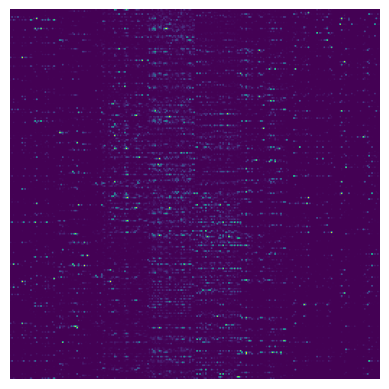

Iteration: 511, Discriminator Loss: 0.292, Generator Loss: 1.386
Iteration: 512, Discriminator Loss: 0.160, Generator Loss: 1.927
Iteration: 513, Discriminator Loss: 0.037, Generator Loss: 3.339
Iteration: 514, Discriminator Loss: 0.057, Generator Loss: 2.899
Iteration: 515, Discriminator Loss: 0.151, Generator Loss: 1.973
Iteration: 516, Discriminator Loss: 0.091, Generator Loss: 2.451
Iteration: 517, Discriminator Loss: 0.107, Generator Loss: 2.299
Iteration: 518, Discriminator Loss: 0.318, Generator Loss: 1.312
Iteration: 519, Discriminator Loss: 0.058, Generator Loss: 2.984
Iteration: 520, Discriminator Loss: 0.216, Generator Loss: 1.649


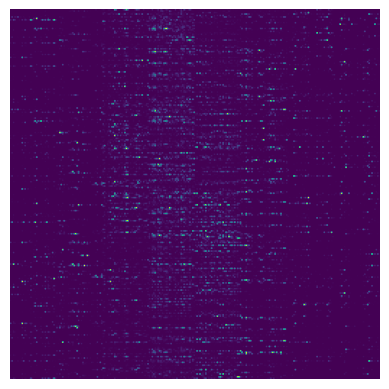

Iteration: 521, Discriminator Loss: 0.149, Generator Loss: 1.992
Iteration: 522, Discriminator Loss: 0.150, Generator Loss: 1.988
Iteration: 523, Discriminator Loss: 0.141, Generator Loss: 2.043
Iteration: 524, Discriminator Loss: 0.178, Generator Loss: 1.828
Iteration: 525, Discriminator Loss: 2.061, Generator Loss: 2.450
Iteration: 526, Discriminator Loss: 0.145, Generator Loss: 1.931
Iteration: 527, Discriminator Loss: 0.132, Generator Loss: 2.054
Iteration: 528, Discriminator Loss: 0.077, Generator Loss: 2.584
Iteration: 529, Discriminator Loss: 0.152, Generator Loss: 1.962
Iteration: 530, Discriminator Loss: 0.219, Generator Loss: 1.635


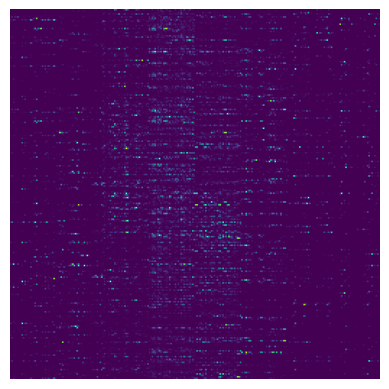

Iteration: 531, Discriminator Loss: 0.144, Generator Loss: 2.020
Iteration: 532, Discriminator Loss: 0.141, Generator Loss: 2.040
Iteration: 533, Discriminator Loss: 0.052, Generator Loss: 2.992
Iteration: 534, Discriminator Loss: 0.229, Generator Loss: 1.603
Iteration: 535, Discriminator Loss: 0.044, Generator Loss: 3.164
Iteration: 536, Discriminator Loss: 0.169, Generator Loss: 1.876
Iteration: 537, Discriminator Loss: 0.039, Generator Loss: 3.275
Iteration: 538, Discriminator Loss: 0.049, Generator Loss: 3.055
Iteration: 539, Discriminator Loss: 0.138, Generator Loss: 2.057
Iteration: 540, Discriminator Loss: 0.036, Generator Loss: 3.365


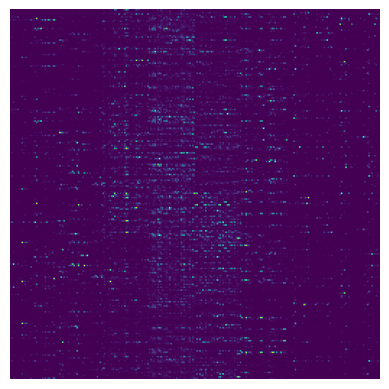

Iteration: 541, Discriminator Loss: 0.280, Generator Loss: 1.968
Iteration: 542, Discriminator Loss: 0.021, Generator Loss: 3.876
Iteration: 543, Discriminator Loss: 0.101, Generator Loss: 2.351
Iteration: 544, Discriminator Loss: 0.056, Generator Loss: 2.912
Iteration: 545, Discriminator Loss: 0.119, Generator Loss: 2.199
Iteration: 546, Discriminator Loss: 0.126, Generator Loss: 2.144
Iteration: 547, Discriminator Loss: 0.084, Generator Loss: 2.531
Iteration: 548, Discriminator Loss: 0.044, Generator Loss: 3.151
Iteration: 549, Discriminator Loss: 0.223, Generator Loss: 1.618
Iteration: 550, Discriminator Loss: 0.492, Generator Loss: 0.958


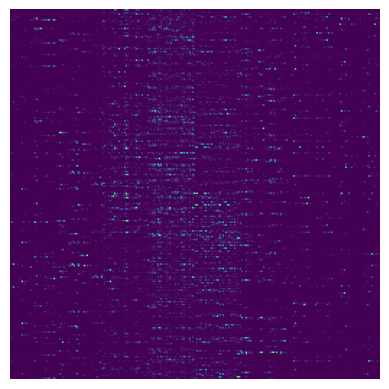

Iteration: 551, Discriminator Loss: 0.094, Generator Loss: 2.431
Iteration: 552, Discriminator Loss: 0.112, Generator Loss: 2.263
Iteration: 553, Discriminator Loss: 0.046, Generator Loss: 3.126
Iteration: 554, Discriminator Loss: 0.031, Generator Loss: 3.504
Iteration: 555, Discriminator Loss: 0.064, Generator Loss: 2.788
Iteration: 556, Discriminator Loss: 0.033, Generator Loss: 3.449
Iteration: 557, Discriminator Loss: 0.111, Generator Loss: 2.263
Iteration: 558, Discriminator Loss: 0.138, Generator Loss: 2.066
Iteration: 559, Discriminator Loss: 0.168, Generator Loss: 2.390
Iteration: 560, Discriminator Loss: 0.210, Generator Loss: 1.675


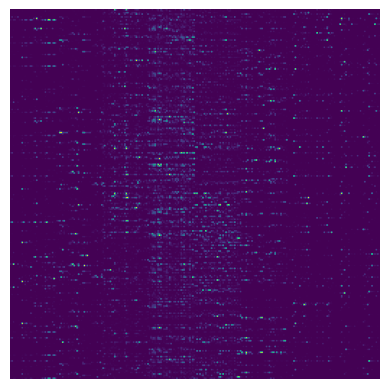

Iteration: 561, Discriminator Loss: 0.084, Generator Loss: 2.531
Iteration: 562, Discriminator Loss: 0.086, Generator Loss: 2.511
Iteration: 563, Discriminator Loss: 0.191, Generator Loss: 1.764
Iteration: 564, Discriminator Loss: 0.078, Generator Loss: 2.658
Iteration: 565, Discriminator Loss: 8.276, Generator Loss: 1.386
Iteration: 566, Discriminator Loss: 0.104, Generator Loss: 2.259
Iteration: 567, Discriminator Loss: 0.009, Generator Loss: 4.656
Iteration: 568, Discriminator Loss: 0.083, Generator Loss: 2.517
Iteration: 569, Discriminator Loss: 0.033, Generator Loss: 3.410
Iteration: 570, Discriminator Loss: 0.135, Generator Loss: 2.079


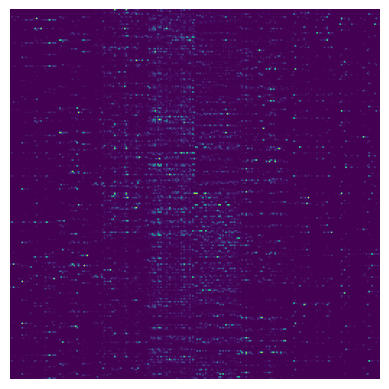

Iteration: 571, Discriminator Loss: 0.172, Generator Loss: 1.855
Iteration: 572, Discriminator Loss: 0.205, Generator Loss: 3.284
Iteration: 573, Discriminator Loss: 0.256, Generator Loss: 1.494
Iteration: 574, Discriminator Loss: 0.065, Generator Loss: 2.781
Iteration: 575, Discriminator Loss: 0.304, Generator Loss: 1.354
Iteration: 576, Discriminator Loss: 0.059, Generator Loss: 2.882
Iteration: 577, Discriminator Loss: 0.147, Generator Loss: 2.003
Iteration: 578, Discriminator Loss: 0.056, Generator Loss: 2.933
Iteration: 579, Discriminator Loss: 0.106, Generator Loss: 2.312
Iteration: 580, Discriminator Loss: 1.213, Generator Loss: 3.544


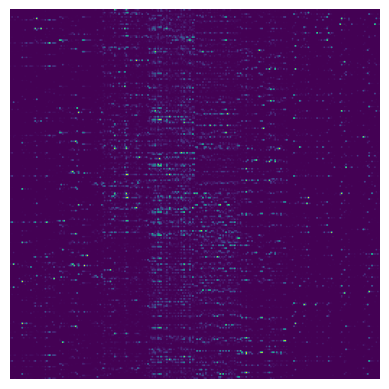

Iteration: 581, Discriminator Loss: 0.089, Generator Loss: 2.448
Iteration: 582, Discriminator Loss: 0.345, Generator Loss: 1.236
Iteration: 583, Discriminator Loss: 0.053, Generator Loss: 2.976
Iteration: 584, Discriminator Loss: 0.148, Generator Loss: 1.995
Iteration: 585, Discriminator Loss: 0.123, Generator Loss: 2.170
Iteration: 586, Discriminator Loss: 0.157, Generator Loss: 1.945
Iteration: 587, Discriminator Loss: 0.135, Generator Loss: 2.084
Iteration: 588, Discriminator Loss: 0.243, Generator Loss: 1.551
Iteration: 589, Discriminator Loss: 0.084, Generator Loss: 2.539
Iteration: 590, Discriminator Loss: 0.111, Generator Loss: 2.274


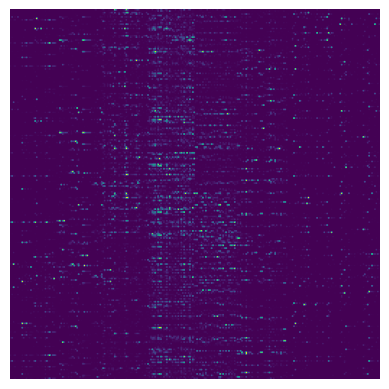

Iteration: 591, Discriminator Loss: 0.062, Generator Loss: 2.832
Iteration: 592, Discriminator Loss: 0.063, Generator Loss: 2.801
Iteration: 593, Discriminator Loss: 0.117, Generator Loss: 2.218
Iteration: 594, Discriminator Loss: 0.024, Generator Loss: 3.769
Iteration: 595, Discriminator Loss: 0.063, Generator Loss: 2.806
Iteration: 596, Discriminator Loss: 0.080, Generator Loss: 2.575
Iteration: 597, Discriminator Loss: 0.146, Generator Loss: 2.014
Iteration: 598, Discriminator Loss: 0.043, Generator Loss: 3.188
Iteration: 599, Discriminator Loss: 0.041, Generator Loss: 3.229
Iteration: 600, Discriminator Loss: 0.097, Generator Loss: 2.392


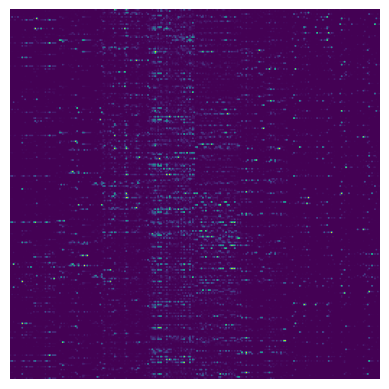

Iteration: 601, Discriminator Loss: 0.078, Generator Loss: 2.605
Iteration: 602, Discriminator Loss: 0.061, Generator Loss: 2.839
Iteration: 603, Discriminator Loss: 0.214, Generator Loss: 1.664
Iteration: 604, Discriminator Loss: 0.071, Generator Loss: 2.691
Iteration: 605, Discriminator Loss: 0.146, Generator Loss: 2.012
Iteration: 606, Discriminator Loss: 0.099, Generator Loss: 2.378
Iteration: 607, Discriminator Loss: 0.006, Generator Loss: 5.080
Iteration: 608, Discriminator Loss: 0.024, Generator Loss: 3.792
Iteration: 609, Discriminator Loss: 0.017, Generator Loss: 4.094
Iteration: 610, Discriminator Loss: 0.013, Generator Loss: 4.365


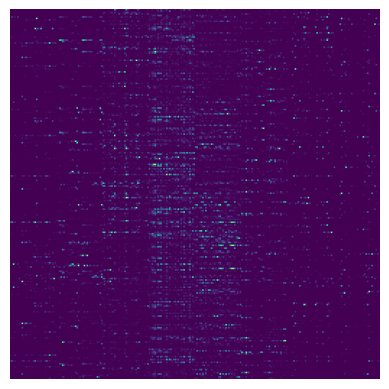

Iteration: 611, Discriminator Loss: 0.102, Generator Loss: 2.343
Iteration: 612, Discriminator Loss: 0.058, Generator Loss: 2.880
Iteration: 613, Discriminator Loss: 0.078, Generator Loss: 2.607
Iteration: 614, Discriminator Loss: 0.354, Generator Loss: 1.306
Iteration: 615, Discriminator Loss: 0.228, Generator Loss: 1.606
Iteration: 616, Discriminator Loss: 0.012, Generator Loss: 4.423
Iteration: 617, Discriminator Loss: 0.023, Generator Loss: 3.780
Iteration: 618, Discriminator Loss: 0.011, Generator Loss: 4.555
Iteration: 619, Discriminator Loss: 0.007, Generator Loss: 5.009
Iteration: 620, Discriminator Loss: 0.324, Generator Loss: 1.299


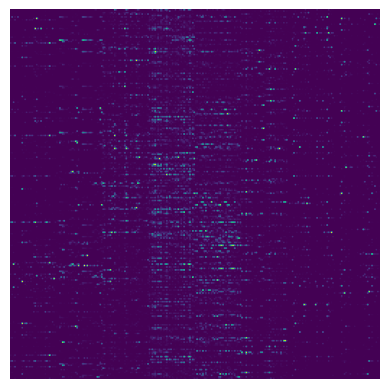

Iteration: 621, Discriminator Loss: 0.257, Generator Loss: 1.505
Iteration: 622, Discriminator Loss: 0.124, Generator Loss: 2.170
Iteration: 623, Discriminator Loss: 0.020, Generator Loss: 3.957
Iteration: 624, Discriminator Loss: 0.042, Generator Loss: 3.203
Iteration: 625, Discriminator Loss: 0.300, Generator Loss: 1.401
Iteration: 626, Discriminator Loss: 0.092, Generator Loss: 2.448
Iteration: 627, Discriminator Loss: 0.045, Generator Loss: 3.145
Iteration: 628, Discriminator Loss: 0.033, Generator Loss: 3.439
Iteration: 629, Discriminator Loss: 0.232, Generator Loss: 1.584
Iteration: 630, Discriminator Loss: 0.097, Generator Loss: 2.395


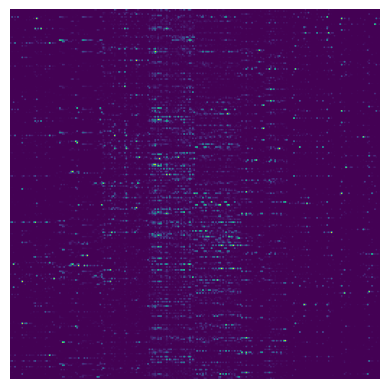

Iteration: 631, Discriminator Loss: 0.044, Generator Loss: 3.157
Iteration: 632, Discriminator Loss: 0.074, Generator Loss: 2.645
Iteration: 633, Discriminator Loss: 0.068, Generator Loss: 2.742
Iteration: 634, Discriminator Loss: 0.231, Generator Loss: 1.589
Iteration: 635, Discriminator Loss: 0.031, Generator Loss: 3.587
Iteration: 636, Discriminator Loss: 0.080, Generator Loss: 3.023
Iteration: 637, Discriminator Loss: 0.087, Generator Loss: 2.488
Iteration: 638, Discriminator Loss: 0.088, Generator Loss: 2.490
Iteration: 639, Discriminator Loss: 0.190, Generator Loss: 1.768
Iteration: 640, Discriminator Loss: 0.020, Generator Loss: 3.936


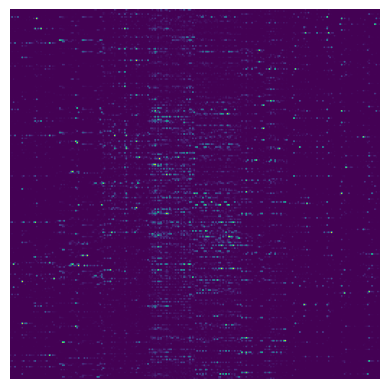

Iteration: 641, Discriminator Loss: 0.135, Generator Loss: 2.084
Iteration: 642, Discriminator Loss: 0.031, Generator Loss: 3.495
Iteration: 643, Discriminator Loss: 0.087, Generator Loss: 2.497
Iteration: 644, Discriminator Loss: 0.051, Generator Loss: 3.018
Iteration: 645, Discriminator Loss: 0.084, Generator Loss: 2.534
Iteration: 646, Discriminator Loss: 0.016, Generator Loss: 4.157
Iteration: 647, Discriminator Loss: 0.030, Generator Loss: 3.524
Iteration: 648, Discriminator Loss: 0.192, Generator Loss: 1.756
Iteration: 649, Discriminator Loss: 0.095, Generator Loss: 2.412
Iteration: 650, Discriminator Loss: 0.083, Generator Loss: 2.545


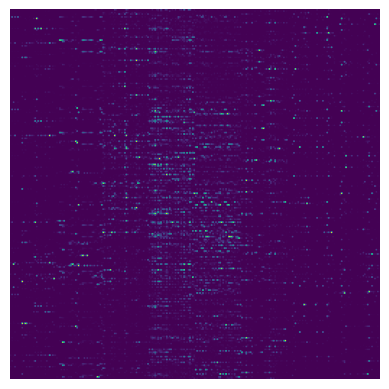

Iteration: 651, Discriminator Loss: 0.023, Generator Loss: 3.809
Iteration: 652, Discriminator Loss: 0.006, Generator Loss: 5.655
Iteration: 653, Discriminator Loss: 0.110, Generator Loss: 2.274
Iteration: 654, Discriminator Loss: 0.029, Generator Loss: 3.552
Iteration: 655, Discriminator Loss: 0.067, Generator Loss: 3.124
Iteration: 656, Discriminator Loss: 0.082, Generator Loss: 2.552
Iteration: 657, Discriminator Loss: 0.134, Generator Loss: 2.087
Iteration: 658, Discriminator Loss: 0.049, Generator Loss: 3.073
Iteration: 659, Discriminator Loss: 0.146, Generator Loss: 2.015
Iteration: 660, Discriminator Loss: 0.018, Generator Loss: 4.038


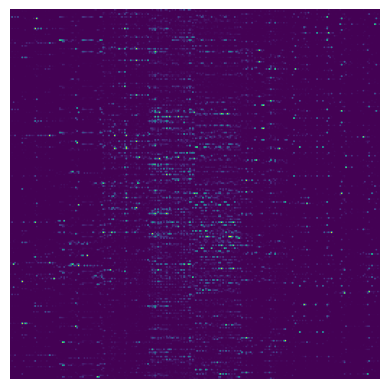

Iteration: 661, Discriminator Loss: 0.053, Generator Loss: 2.965
Iteration: 662, Discriminator Loss: 0.086, Generator Loss: 2.507
Iteration: 663, Discriminator Loss: 0.153, Generator Loss: 1.964
Iteration: 664, Discriminator Loss: 0.001, Generator Loss: 6.941
Iteration: 665, Discriminator Loss: 0.013, Generator Loss: 4.340
Iteration: 666, Discriminator Loss: 0.234, Generator Loss: 1.580
Iteration: 667, Discriminator Loss: 0.019, Generator Loss: 3.962
Iteration: 668, Discriminator Loss: 0.027, Generator Loss: 3.708
Iteration: 669, Discriminator Loss: 0.112, Generator Loss: 2.258
Iteration: 670, Discriminator Loss: 0.078, Generator Loss: 2.601


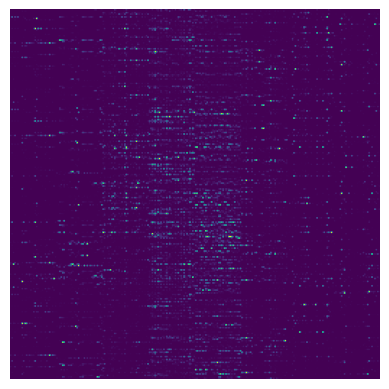

Iteration: 671, Discriminator Loss: 0.004, Generator Loss: 5.660
Iteration: 672, Discriminator Loss: 0.024, Generator Loss: 3.736
Iteration: 673, Discriminator Loss: 0.146, Generator Loss: 2.007
Iteration: 674, Discriminator Loss: 0.028, Generator Loss: 3.593
Iteration: 675, Discriminator Loss: 0.004, Generator Loss: 5.465
Iteration: 676, Discriminator Loss: 0.009, Generator Loss: 4.679
Iteration: 677, Discriminator Loss: 0.015, Generator Loss: 4.225
Iteration: 678, Discriminator Loss: 0.005, Generator Loss: 5.362
Iteration: 679, Discriminator Loss: 0.034, Generator Loss: 3.401
Iteration: 680, Discriminator Loss: 0.023, Generator Loss: 3.774


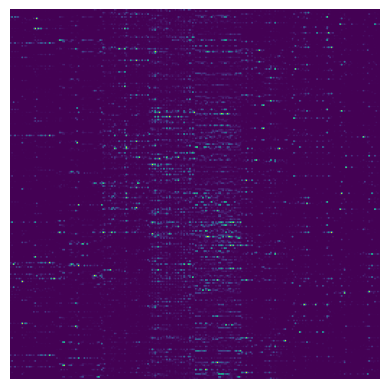

Iteration: 681, Discriminator Loss: 0.037, Generator Loss: 3.335
Iteration: 682, Discriminator Loss: 0.024, Generator Loss: 3.756
Iteration: 683, Discriminator Loss: 0.003, Generator Loss: 5.834
Iteration: 684, Discriminator Loss: 1.351, Generator Loss: 2.901
Iteration: 685, Discriminator Loss: 0.058, Generator Loss: 2.855
Iteration: 686, Discriminator Loss: 0.041, Generator Loss: 3.204
Iteration: 687, Discriminator Loss: 5.920, Generator Loss: 2.551
Iteration: 688, Discriminator Loss: 0.012, Generator Loss: 4.365
Iteration: 689, Discriminator Loss: 0.006, Generator Loss: 5.056
Iteration: 690, Discriminator Loss: 0.032, Generator Loss: 3.435


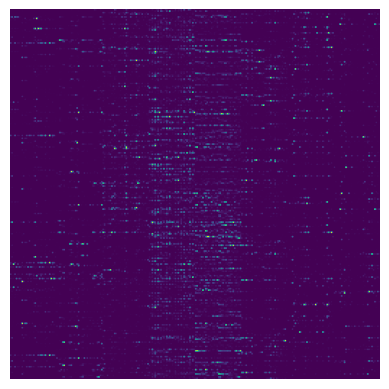

Iteration: 691, Discriminator Loss: 0.102, Generator Loss: 2.329
Iteration: 692, Discriminator Loss: 0.019, Generator Loss: 3.978
Iteration: 693, Discriminator Loss: 0.013, Generator Loss: 4.326
Iteration: 694, Discriminator Loss: 0.080, Generator Loss: 2.579
Iteration: 695, Discriminator Loss: 0.072, Generator Loss: 2.750
Iteration: 696, Discriminator Loss: 0.206, Generator Loss: 1.693
Iteration: 697, Discriminator Loss: 0.061, Generator Loss: 2.833
Iteration: 698, Discriminator Loss: 0.059, Generator Loss: 2.865
Iteration: 699, Discriminator Loss: 0.314, Generator Loss: 1.324
Iteration: 700, Discriminator Loss: 0.126, Generator Loss: 2.149


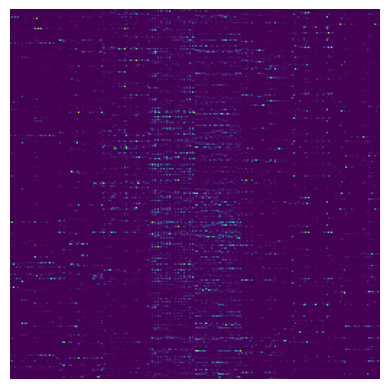

Iteration: 701, Discriminator Loss: 0.014, Generator Loss: 4.276
Iteration: 702, Discriminator Loss: 0.023, Generator Loss: 3.777
Iteration: 703, Discriminator Loss: 0.211, Generator Loss: 1.674
Iteration: 704, Discriminator Loss: 0.178, Generator Loss: 1.833
Iteration: 705, Discriminator Loss: 0.018, Generator Loss: 4.055
Iteration: 706, Discriminator Loss: 0.022, Generator Loss: 3.857
Iteration: 707, Discriminator Loss: 0.030, Generator Loss: 3.541
Iteration: 708, Discriminator Loss: 0.035, Generator Loss: 3.364
Iteration: 709, Discriminator Loss: 0.033, Generator Loss: 3.424
Iteration: 710, Discriminator Loss: 0.040, Generator Loss: 3.252


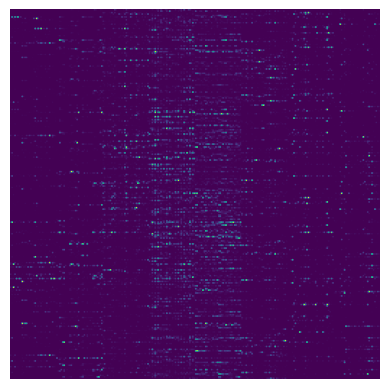

Iteration: 711, Discriminator Loss: 0.015, Generator Loss: 4.274
Iteration: 712, Discriminator Loss: 0.023, Generator Loss: 3.781
Iteration: 713, Discriminator Loss: 0.040, Generator Loss: 3.249
Iteration: 714, Discriminator Loss: 0.057, Generator Loss: 2.907
Iteration: 715, Discriminator Loss: 0.011, Generator Loss: 4.541
Iteration: 716, Discriminator Loss: 24.813, Generator Loss: 2.929
Iteration: 717, Discriminator Loss: 0.050, Generator Loss: 2.818
Iteration: 718, Discriminator Loss: 0.048, Generator Loss: 3.016
Iteration: 719, Discriminator Loss: 0.050, Generator Loss: 2.967
Iteration: 720, Discriminator Loss: 0.122, Generator Loss: 2.156


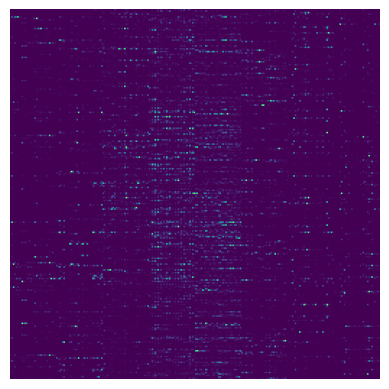

Iteration: 721, Discriminator Loss: 0.096, Generator Loss: 2.466
Iteration: 722, Discriminator Loss: 0.102, Generator Loss: 2.343
Iteration: 723, Discriminator Loss: 0.035, Generator Loss: 3.377
Iteration: 724, Discriminator Loss: 0.076, Generator Loss: 2.653
Iteration: 725, Discriminator Loss: 0.177, Generator Loss: 1.828
Iteration: 726, Discriminator Loss: 0.056, Generator Loss: 2.914
Iteration: 727, Discriminator Loss: 0.055, Generator Loss: 2.937
Iteration: 728, Discriminator Loss: 0.016, Generator Loss: 4.126
Iteration: 729, Discriminator Loss: 2.390, Generator Loss: 3.316
Iteration: 730, Discriminator Loss: 0.679, Generator Loss: 3.085


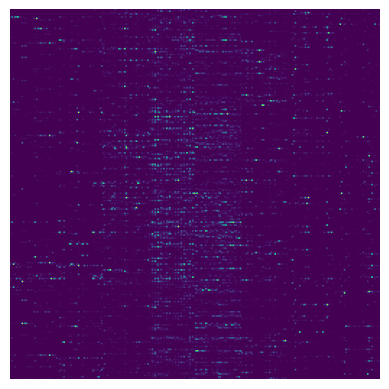

Iteration: 731, Discriminator Loss: 0.051, Generator Loss: 2.934
Iteration: 732, Discriminator Loss: 0.234, Generator Loss: 1.544
Iteration: 733, Discriminator Loss: 0.129, Generator Loss: 2.107
Iteration: 734, Discriminator Loss: 0.117, Generator Loss: 2.210
Iteration: 735, Discriminator Loss: 0.072, Generator Loss: 2.675
Iteration: 736, Discriminator Loss: 0.029, Generator Loss: 3.569
Iteration: 737, Discriminator Loss: 0.133, Generator Loss: 2.263
Iteration: 738, Discriminator Loss: 0.147, Generator Loss: 1.995
Iteration: 739, Discriminator Loss: 3.922, Generator Loss: 2.265
Iteration: 740, Discriminator Loss: 0.114, Generator Loss: 2.192


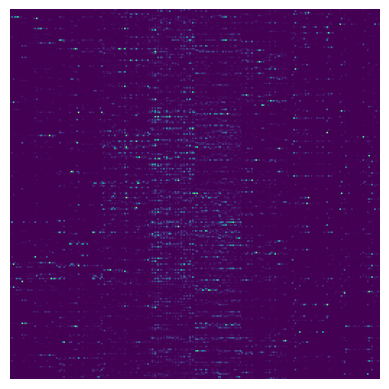

Iteration: 741, Discriminator Loss: 0.037, Generator Loss: 3.294
Iteration: 742, Discriminator Loss: 0.256, Generator Loss: 1.490
Iteration: 743, Discriminator Loss: 0.189, Generator Loss: 1.764
Iteration: 744, Discriminator Loss: 0.069, Generator Loss: 2.719
Iteration: 745, Discriminator Loss: 0.389, Generator Loss: 1.142
Iteration: 746, Discriminator Loss: 0.095, Generator Loss: 2.410
Iteration: 747, Discriminator Loss: 0.017, Generator Loss: 4.096
Iteration: 748, Discriminator Loss: 0.096, Generator Loss: 2.400
Iteration: 749, Discriminator Loss: 0.461, Generator Loss: 1.008
Iteration: 750, Discriminator Loss: 0.271, Generator Loss: 1.450


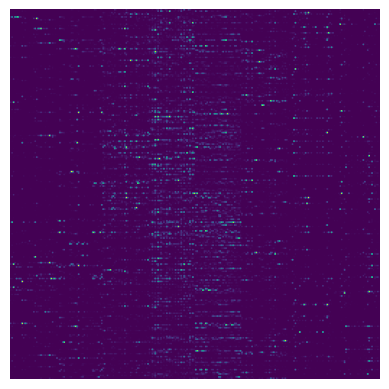

In [13]:
num_iter = 750

while True:
    for i, (data, _) in enumerate(dataloader):

        # Data for training the discriminator
        data = data.view(-1, color_channel, 256, 256)
        # additive_noise = data + torch.randn_like(data) * 0.2
        # real_data = (data + additive_noise).to(device)
        real_data = data.to(device)

        # Noise follwing a uniform distribution in range [-pi, pi)
        noise = (torch.rand(batch_size, latent_size, device=device) * 2 - 1) * math.pi
        fake_data = generator(noise)

        # Training the discriminator
        discriminator.zero_grad()
        outD_real = discriminator(real_data).view(-1)
        outD_fake = discriminator(fake_data.detach()).view(-1)

        errD_real = criterion(outD_real, real_labels)
        errD_fake = criterion(outD_fake, fake_labels)
        # Propagate gradients
        errD_real.backward()
        errD_fake.backward()

        errD = errD_real + errD_fake
        optD.step()

        # Training the generator
        generator.zero_grad()
        
        outD_fake = discriminator(fake_data).view(-1)
        errG = criterion(outD_fake, real_labels)
        errG.backward()
        optG.step()

        counter += 1

        # Show loss values
        print(f'Iteration: {counter}, Discriminator Loss: {errD:0.3f}, Generator Loss: {errG:0.3f}')
        if counter % 10 == 0:
            # Save images every 10 iterations
            test_image = generator(fixed_noise).view(color_channel, image_size, image_size).permute(1, 2, 0).cpu().detach()
            results.append(test_image)
            plt.imshow(test_image)
            plt.axis('off')
            plt.show()
            
            
        if counter == num_iter:
            break
    if counter == num_iter:
        break